# Table of Contents
 <p><div class="lev1"><a href="#Import-Libraries-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import Libraries</a></div><div class="lev1"><a href="#Helper-Functions-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Helper Functions</a></div><div class="lev1"><a href="#Data-Import-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Data Import</a></div><div class="lev2"><a href="#Split-into-years-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Split into years</a></div><div class="lev2"><a href="#Create-yearly-graphs-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Create yearly graphs</a></div><div class="lev2"><a href="#Split-into-months-and-create-monthly-graphs-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Split into months and create monthly graphs</a></div><div class="lev2"><a href="#Visualise-Networks-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Visualise Networks</a></div><div class="lev1"><a href="#Centrality-and-Assortativity-Analysis-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Centrality and Assortativity Analysis</a></div><div class="lev2"><a href="#Centrality-Analysis:-Year-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Centrality Analysis: Year</a></div><div class="lev2"><a href="#Calculate-average-of-attributes-for-yearly-networks-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Calculate average of attributes for yearly networks</a></div><div class="lev2"><a href="#Observations-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Observations</a></div><div class="lev2"><a href="#Monthly-Analysis-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Monthly Analysis</a></div><div class="lev2"><a href="#Comparison-of-Yearly-and-Monthly-trends-in-Centrality-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Comparison of Yearly and Monthly trends in Centrality</a></div><div class="lev1"><a href="#Attributes-Analysis-on-Graphs-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Attributes Analysis on Graphs</a></div><div class="lev2"><a href="#Mean-Curvature-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Mean Curvature</a></div><div class="lev2"><a href="#Instantaneous-Amplitude-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Instantaneous Amplitude</a></div><div class="lev2"><a href="#Instantaneous-Frequency-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Instantaneous Frequency</a></div><div class="lev2"><a href="#Instantaneous-Phase-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Instantaneous Phase</a></div><div class="lev2"><a href="#Energy-Envelope-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>Energy Envelope</a></div><div class="lev2"><a href="#First-derivative-of-Energy-Envelope-5.6"><span class="toc-item-num">5.6&nbsp;&nbsp;</span>First derivative of Energy Envelope</a></div><div class="lev2"><a href="#Second-Derivative-of-Energy-Envelope-5.7"><span class="toc-item-num">5.7&nbsp;&nbsp;</span>Second Derivative of Energy Envelope</a></div><div class="lev2"><a href="#Standardized-Kernel-PCA-3-Component-Ratio-Correlation-Average-5.8"><span class="toc-item-num">5.8&nbsp;&nbsp;</span>Standardized Kernel PCA 3 Component Ratio Correlation Average</a></div><div class="lev1"><a href="#Resistance-Distance-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Resistance Distance</a></div><div class="lev1"><a href="#Stationarity-Ratio-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Stationarity Ratio</a></div><div class="lev1"><a href="#Comparison-of-Attributes-over-time-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Comparison of Attributes over time</a></div><div class="lev1"><a href="#Towards-Global-Measures-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Towards Global Measures</a></div><div class="lev2"><a href="#Subgraph-Stationarity-9.1"><span class="toc-item-num">9.1&nbsp;&nbsp;</span>Subgraph Stationarity</a></div>

# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
import scipy as sc
import random
from scipy.signal import *
from numpy.linalg import *
random.seed(1111111111111)
#plotting parameters
%matplotlib inline
sns.set(style="whitegrid", color_codes=True, context='paper')
plt.rc('axes', grid=False, titlesize='large', labelsize='large',labelweight='heavy')
plt.rc('lines', linewidth=4)
plt.rc('font',family='serif',size=16, serif='Georgia')
plt.rc('figure', figsize = (15,6),titlesize='large',titleweight='heavy')
plt.rc('grid',linewidth=3)
sns.set_palette('cool')

# Helper Functions

In [2]:
def get_val(val):
    return sorted(set(val.values()))

In [3]:
def avg_cent(cent):
    avg = sum(set(cent.values()))/len(cent)
    return avg

In [4]:
def get_cent(net):
    degC = nx.degree_centrality(net)
    cloC = nx.closeness_centrality(net)
    betC = nx.betweenness_centrality(net)
    eigC = nx.eigenvector_centrality_numpy(net)
    katzC = nx.katz_centrality_numpy(net)
    loadC = nx.load_centrality(net)
    
    #cent_df = pd.Data
        
    return [degC,cloC,betC,eigC,katzC, loadC]

In [5]:
def stationarity_ratio(G):
    #stationarity ratio with laplian
    L = nx.laplacian_matrix(G).todense()
    U = nx.laplacian_spectrum(G)
    C =np.cov(L)
    CF = np.dot(L,np.dot(np.dot(U.T,C),U))
    r = np.linalg.norm(np.diag(CF))/np.linalg.norm(CF)
       
    return [r]

In [6]:
#cite:`klein1993resistance`
def resistance_distance(net):  
    M = nx.laplacian_matrix(net).todense()
    pseudo = pinv(M)
    N = M.shape[0]
    d = np.diag(pseudo)
    rd  = np.kron(d,np.ones((N,1))).T+np.kron(d,np.ones((N,1))).T - pseudo - pseudo.T
    
    return [rd, rd.mean()]

In [7]:
def calc_seisatt(net):
    M = nx.laplacian_matrix(net).todense()
    Ht = hilbert(M)     
    IA = np.real(np.nan_to_num(np.sqrt(np.dot(M,M)+np.dot(Ht,Ht))))
    IP = np.real(np.nan_to_num(np.arctan(Ht/M)))
    IF,_ = np.real(np.nan_to_num(np.asarray(np.gradient(IP))))
    E = np.real(np.sqrt(np.dot(M,M)+np.dot(Ht,Ht)))
    dE, _ = np.nan_to_num(np.asarray(np.gradient(E))) 
    dEe, _ = np.nan_to_num(np.asarray(np.gradient(dE)))
    
    
    att_globalval = pd.DataFrame([IA.mean(),IP.mean(),IF.mean(),\
                                  E.mean(),dE.mean(),dEe.mean()]).T
    att_globalval.columns =['InstAmp','InstPhase','InstFreq','EnergyEnv','dEnergyEnv','d2EnergyEnv']
   
    return [IA,IP,IF,E, dE, dEe, att_globalval]

In [8]:
def curvature(net):
    from skimage.feature import hessian_matrix, hessian_matrix_det, hessian_matrix_eigvals
    M = nx.laplacian_matrix(net).todense()
    M = np.float64(M)
    fx, fy = np.gradient(M)
    Hxx, Hxy, Hyy = hessian_matrix(M)
    K = np.divide((np.dot(Hxx,Hxy)-np.dot(Hxy,Hxy)),\
                  (1+np.dot(fx,fx)+np.dot(fy,fy)))
    
    He1,_ = hessian_matrix_eigvals(Hxx,Hxy,Hyy)
    mean_curv = np.trace(He1)
    s, a = np.linalg.slogdet(He1)
    conc = s * np.exp(a)
    Pmax = np.max(He1)
    Pmin = np.min(He1)
    
    return [K,mean_curv,conc]

In [9]:
def cal_avgstat(net):
    #calculate all attributes from previously defined functions here
    degC,cloC,betC,eigC,katzC, loadC = get_cent(net)
    _,meanK,_ = curvature(net)
    IA,IP,IF,E, dE, dEe, att_globalval = calc_seisatt(net)
    _,norm_rd = resistance_distance(net)
    r = stationarity_ratio(net)
    den = nx.density(net)
    clustcof = nx.average_clustering(net)
    algcon = nx.algebraic_connectivity(net)
    
    #create attribute volume here
    stat_df = pd.DataFrame([avg_cent(degC),avg_cent(cloC), avg_cent(betC),avg_cent(eigC), \
            avg_cent(katzC), avg_cent(loadC), den, clustcof,algcon, meanK, ]).T
    stat_df.columns= ['AvgDeg','AvgCloseness','AvgBet','AvgEig','AvgKatz','AvgLoad','Density','AvgClustCoef',\
                      'AlgebraicConnect','MeanKurv',]
    stat_df = stat_df.join(att_globalval)
    stat_df['MeanResistanceDist']= norm_rd
    stat_df['StatRat']=r
   
        
    return stat_df

In [10]:
def get_top_keys(dictionary, top):
    items = dictionary.items()
    items = sorted(items,reverse=True, key=lambda x: x[1])
    obj = map(lambda x: x[0], items[:top])
    for i in obj:
        print(i)
    #return map(lambda x: x[0], items[:top])

In [11]:
def std_klpca_ratio(net):
    from sklearn.decomposition import KernelPCA 
    M = nx.laplacian_matrix(net)
    kpca =KernelPCA(n_components=3,kernel='rbf')
    eigv = kpca.fit_transform(M)
    pc1_std = eigv[0] - eigv[0].mean() /eigv[0].std()
    pc2_std = eigv[1] - eigv[1].mean() /eigv[1].std()
    pc3_std = eigv[2] - eigv[2].mean() /eigv[2].std()
    klpca_ratio_std = pc1_std - pc3_std/pc1_std - pc2_std
    
    return klpca_ratio_std

In [12]:
def create_graph(df):
    tmp = df.values[:,1:3]
    G= nx.Graph()
    G = nx.from_edgelist(tmp)
    
    return G

In [13]:
def emergence(a,b):
    e = (a-b)/ (np.linalg.norm(a)+np.linalg.norm(b))
    return e

In [14]:
def avg_klpca_corr(net1,net2):
    avg = np.mean(np.correlate(std_klpca_ratio(net1),std_klpca_ratio(net2)))
    return avg
    

In [15]:
def rms(a, axis=None):
    from numpy import mean, sqrt,square
    rms = sqrt(mean(square(a), axis=axis))
    return rms

def nrms(a,b):
    nrms = rms(a-b)/(rms(a)+ rms(b))
    return nrms

In [16]:
def get_centhistval(cent_dict, title=None):
    from collections import Counter
    vals = list(Counter(cent_dict.values()))
    freq = list(Counter(cent_dict.values()).values())
    plt.figure()
    plt.scatter(vals,freq, s=100, marker='^',c='k')
    plt.title("Distribution of " + str(title), fontsize=20)
    plt.xlabel("Centrality Value", fontsize=18)
    plt.ylabel("No. of Nodes", fontsize=18)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.tight_layout()
    
    return [vals,freq]

In [104]:
def pad_shape(x,ref,offset=0):
    result = np.zeros_like(ref)
    result[0:x.shape[0]+0,0:x.shape[1]+0] = x
    
    return result

In [105]:
def subgraph_stat(net1,net2):
    net1_int_net2 = net1.copy()
    net1_int_net2.remove_nodes_from(n for n in net1 if n not in net2)
    net1_u_net2 = nx.disjoint_union(net1, net2)
    int_adjmat = nx.adjacency_matrix(net1_int_net2).todense()
    uni_adjmat = nx.adjacency_matrix(net1_u_net2).todense()
    int_adjmat_pad = pad_shape(int_adjmat,uni_adjmat)
    
    Ct = np.divide(norm(int_adjmat_pad),norm(uni_adjmat))
    
    return Ct

In [157]:
def emergence(a,b):
    e = (a-b)/ (np.linalg.norm(a)+np.linalg.norm(b))
    return e

# Data Import

In [17]:
data = pd.read_excel("../Data/data 03.2.xlsx")

In [18]:
data.head()

,timestamp,to,from,year,month
0,1979-12-31 21:00:00,24,153,1979,12
1,1979-12-31 21:00:00,24,153,1979,12
2,1979-12-31 21:00:00,29,29,1979,12
3,1979-12-31 21:00:00,29,29,1979,12
4,1979-12-31 21:00:00,29,29,1979,12


In [19]:
years = sorted(set(data.year))
years

[1979, 1998, 1999, 2000, 2001, 2002]

In [20]:
#total % of mislabelled 1979 entries
(data[data.year==1979].count()/data.shape[0]) * 100

timestamp    0.138746
to           0.138746
from         0.138746
year         0.138746
month        0.138746
dtype: float64

## Split into years

In [21]:
df_98 = data[data.year==years[1]]
df_99 = data[data.year==years[2]]
df_2k = data[data.year==years[3]]
df_2k1 = data[data.year==years[4]]
df_2k2 = data[data.year==years[5]]

In [22]:
df_2k.head()

,timestamp,to,from,year,month
3971,2000-01-03 06:47:00,82,51,2000,1
3972,2000-01-03 06:47:00,82,51,2000,1
3973,2000-01-03 06:47:00,82,51,2000,1
3974,2000-01-03 06:47:00,82,51,2000,1
3975,2000-01-03 06:47:00,82,51,2000,1


## Create yearly graphs

In [23]:
Gt0 = create_graph(df_98)
Gt1 = create_graph(df_99)
Gt2 = create_graph(df_2k)
Gt3 = create_graph(df_2k1)
Gt4 = create_graph(df_2k2)

## Split into months and create monthly graphs

In [24]:
nov_98 = df_98[df_98.month==11]
dec_98= df_98[df_98.month==12]

G_nov98 = create_graph(nov_98)
G_dec98 = create_graph(dec_98)

In [25]:
jan_99=df_99[df_99.month==1]
feb_99=df_99[df_99.month==2]
mar_99=df_99[df_99.month==3]
apr_99=df_99[df_99.month==4]
may_99=df_99[df_99.month==5]
jun_99=df_99[df_99.month==6]
jul_99=df_99[df_99.month==7]
aug_99=df_99[df_99.month==8]
sep_99=df_99[df_99.month==9]
oct_99=df_99[df_99.month==10]
nov_99=df_99[df_99.month==11]
dec_99=df_99[df_99.month==12]


G_jan_99=create_graph(jan_99)
G_feb_99=create_graph(feb_99)
G_mar_99=create_graph(mar_99)
G_apr_99=create_graph(apr_99)
G_may_99=create_graph(may_99)
G_jun_99=create_graph(jun_99)
G_jul_99=create_graph(jul_99)
G_aug_99=create_graph(aug_99)
G_sep_99=create_graph(sep_99)
G_oct_99=create_graph(oct_99)
G_nov_99=create_graph(nov_99)
G_dec_99=create_graph(dec_99)

In [26]:
jan_2k=df_2k[df_2k.month==1]
feb_2k=df_2k[df_2k.month==2]
mar_2k=df_2k[df_2k.month==3]
apr_2k=df_2k[df_2k.month==4]
may_2k=df_2k[df_2k.month==5]
jun_2k=df_2k[df_2k.month==6]
jul_2k=df_2k[df_2k.month==7]
aug_2k=df_2k[df_2k.month==8]
sep_2k=df_2k[df_2k.month==9]
oct_2k=df_2k[df_2k.month==10]
nov_2k=df_2k[df_2k.month==11]
dec_2k=df_2k[df_2k.month==12]


G_jan_2k=create_graph(jan_2k)
G_feb_2k=create_graph(feb_2k)
G_mar_2k=create_graph(mar_2k)
G_apr_2k=create_graph(apr_2k)
G_may_2k=create_graph(may_2k)
G_jun_2k=create_graph(jun_2k)
G_jul_2k=create_graph(jul_2k)
G_aug_2k=create_graph(aug_2k)
G_sep_2k=create_graph(sep_2k)
G_oct_2k=create_graph(oct_2k)
G_nov_2k=create_graph(nov_2k)
G_dec_2k=create_graph(dec_2k)

In [27]:
jan_2k1=df_2k1[df_2k1.month==1]
feb_2k1=df_2k1[df_2k1.month==2]
mar_2k1=df_2k1[df_2k1.month==3]
apr_2k1=df_2k1[df_2k1.month==4]
may_2k1=df_2k1[df_2k1.month==5]
jun_2k1=df_2k1[df_2k1.month==6]
jul_2k1=df_2k1[df_2k1.month==7]
aug_2k1=df_2k1[df_2k1.month==8]
sep_2k1=df_2k1[df_2k1.month==9]
oct_2k1=df_2k1[df_2k1.month==10]
nov_2k1=df_2k1[df_2k1.month==11]
dec_2k1=df_2k1[df_2k1.month==12]


G_jan_2k1=create_graph(jan_2k1)
G_feb_2k1=create_graph(feb_2k1)
G_mar_2k1=create_graph(mar_2k1)
G_apr_2k1=create_graph(apr_2k1)
G_may_2k1=create_graph(may_2k1)
G_jun_2k1=create_graph(jun_2k1)
G_jul_2k1=create_graph(jul_2k1)
G_aug_2k1=create_graph(aug_2k1)
G_sep_2k1=create_graph(sep_2k1)
G_oct_2k1=create_graph(oct_2k1)
G_nov_2k1=create_graph(nov_2k1)
G_dec_2k1=create_graph(dec_2k1)

In [28]:
jan_2k2=df_2k2[df_2k2.month==1]
feb_2k2=df_2k2[df_2k2.month==2]
mar_2k2=df_2k2[df_2k2.month==3]
apr_2k2=df_2k2[df_2k2.month==4]
may_2k2=df_2k2[df_2k2.month==5]
jun_2k2=df_2k2[df_2k2.month==6]
jul_2k2=df_2k2[df_2k2.month==7]
aug_2k2=df_2k2[df_2k2.month==8]
sep_2k2=df_2k2[df_2k2.month==9]
oct_2k2=df_2k2[df_2k2.month==10]
nov_2k2=df_2k2[df_2k2.month==11]
dec_2k2=df_2k2[df_2k2.month==12]


G_jan_2k2=create_graph(jan_2k2)
G_feb_2k2=create_graph(feb_2k2)
G_mar_2k2=create_graph(mar_2k2)
G_apr_2k2=create_graph(apr_2k2)
G_may_2k2=create_graph(may_2k2)
G_jun_2k2=create_graph(jun_2k2)
G_jul_2k2=create_graph(jul_2k2)
G_aug_2k2=create_graph(aug_2k2)
G_sep_2k2=create_graph(sep_2k2)
G_oct_2k2=create_graph(oct_2k2)
G_nov_2k2=create_graph(nov_2k2)
G_dec_2k2=create_graph(dec_2k2)

## Visualise Networks 

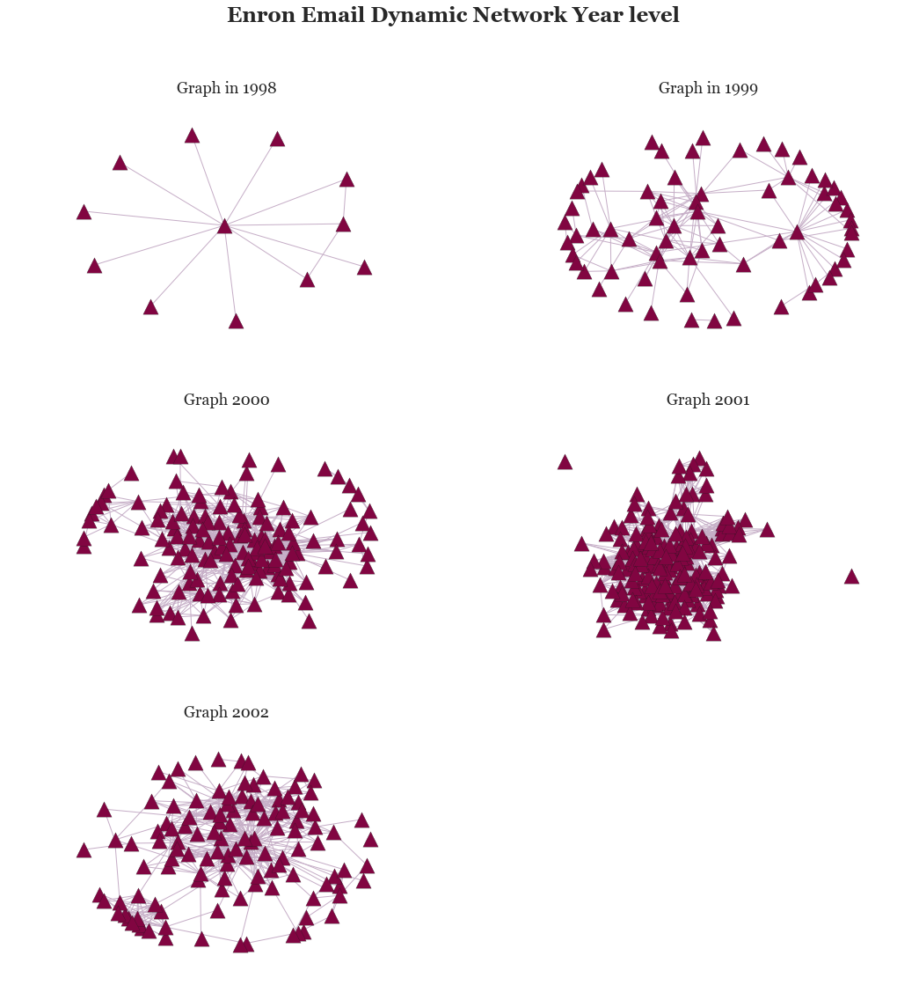

In [29]:
plt.figure(figsize=(18,18))
plt.suptitle('Enron Email Dynamic Network Year level', fontsize=24)
plt.subplot(321)
nx.draw_spring(Gt0,  node_color='#810541',node_shape='^',edge_color ='#C6AEC7')
plt.title("Graph in 1998", fontsize=18)

plt.subplot(322)
nx.draw_spring(Gt1,  node_color='#810541',node_shape='^',edge_color ='#C6AEC7')
plt.title("Graph in 1999", fontsize=18)

plt.subplot(323)
nx.draw_spring(Gt2,  node_color='#810541',node_shape='^',edge_color ='#C6AEC7')
plt.title("Graph 2000", fontsize=18)

plt.subplot(324)
nx.draw_spring(Gt3,  node_color='#810541',node_shape='^',edge_color ='#C6AEC7')
plt.title("Graph 2001", fontsize=18)

plt.subplot(325)
nx.draw_spring(Gt4,  node_color='#810541',node_shape='^',edge_color ='#C6AEC7')
plt.title("Graph 2002", fontsize=18)

plt.show()

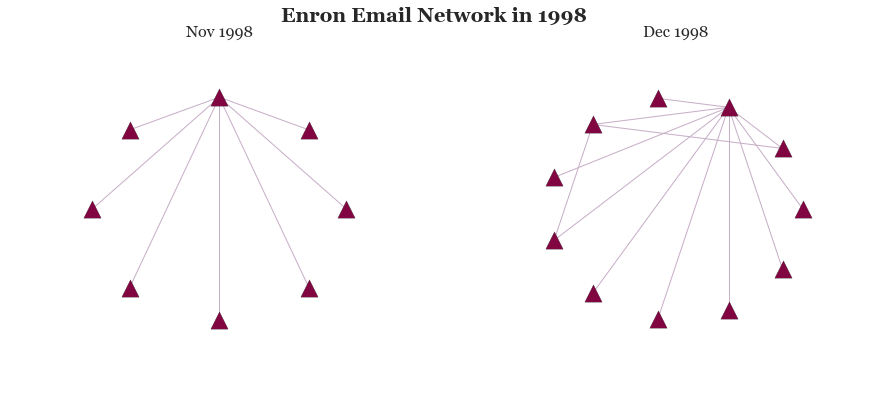

In [30]:
plt.figure()
plt.suptitle("Enron Email Network in 1998", fontsize=20)
plt.subplot(121)
plt.title("Nov 1998", fontsize=16)
nx.draw_circular(G_nov98, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')
plt.subplot(122)
plt.title("Dec 1998", fontsize=16)
nx.draw_circular(G_dec98, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

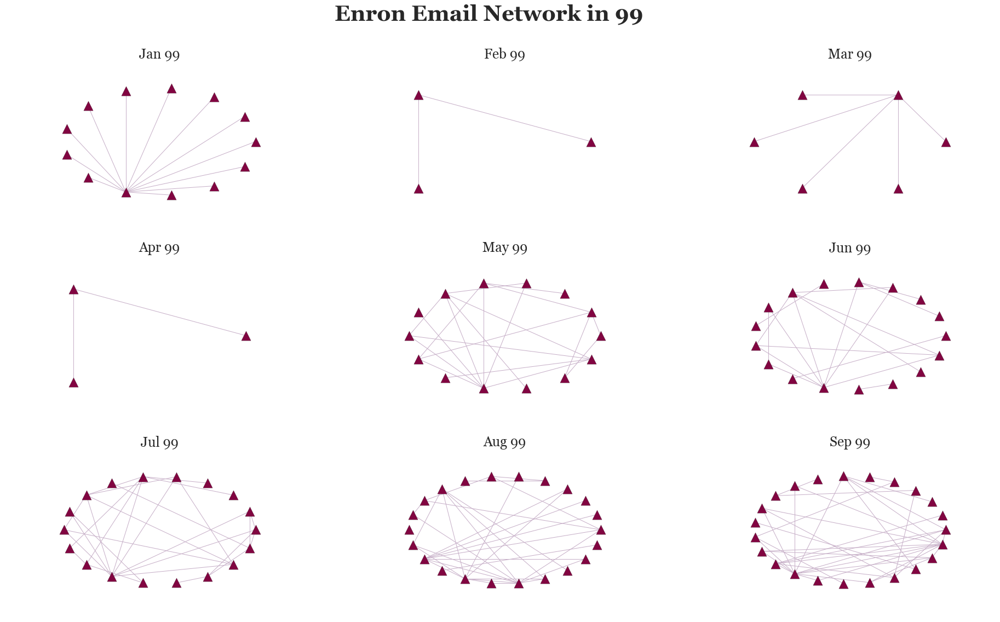

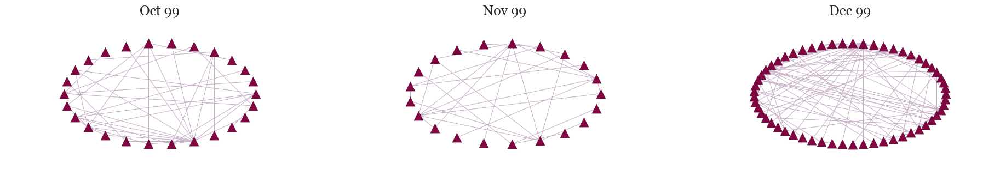

In [31]:
plt.figure(figsize=(32,18))
plt.suptitle("Enron Email Network in 99", fontsize=40)

plt.subplot(331)
plt.title("Jan 99", fontsize=25)
nx.draw_circular(G_jan_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(332)
plt.title("Feb 99", fontsize=25)
nx.draw_circular(G_feb_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(333)
plt.title("Mar 99", fontsize=25)
nx.draw_circular(G_mar_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(334)
plt.title("Apr 99", fontsize=25)
nx.draw_circular(G_apr_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(335)
plt.title("May 99", fontsize=25)
nx.draw_circular(G_may_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(336)
plt.title("Jun 99", fontsize=25)
nx.draw_circular(G_jun_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(337)
plt.title("Jul 99", fontsize=25)
nx.draw_circular(G_jul_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(338)
plt.title("Aug 99", fontsize=25)
nx.draw_circular(G_aug_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(339)
plt.title("Sep 99", fontsize=25)
nx.draw_circular(G_sep_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.figure(figsize=(32,5))
#plt.suptitle("Enron Email Network in 99", fontsize=40)

plt.subplot(131)
plt.title("Oct 99", fontsize=25)
nx.draw_circular(G_oct_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(132)
plt.title("Nov 99", fontsize=25)
nx.draw_circular(G_nov_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(133)
plt.title("Dec 99", fontsize=25)
nx.draw_circular(G_dec_99, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

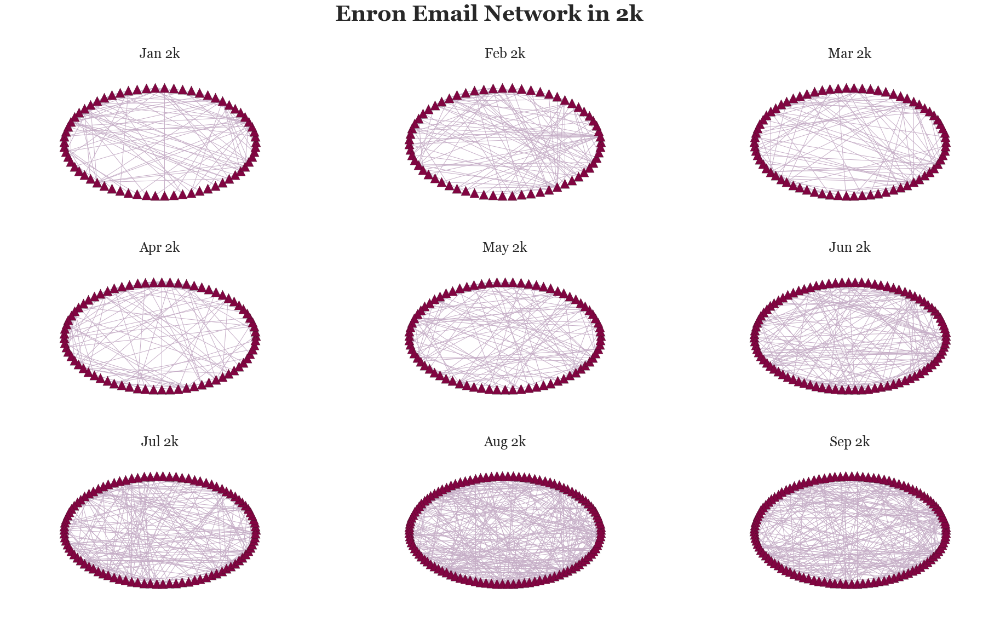

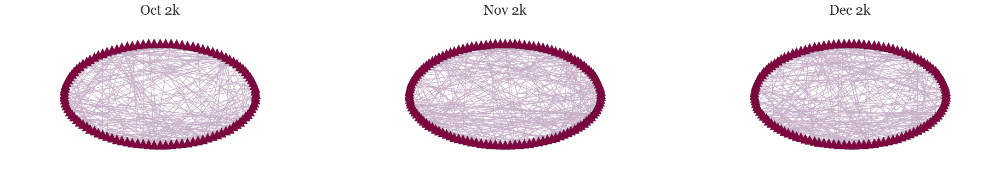

In [32]:
plt.figure(figsize=(32,18))
plt.suptitle("Enron Email Network in 2k", fontsize=40)

plt.subplot(331)
plt.title("Jan 2k", fontsize=25)
nx.draw_circular(G_jan_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(332)
plt.title("Feb 2k", fontsize=25)
nx.draw_circular(G_feb_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(333)
plt.title("Mar 2k", fontsize=25)
nx.draw_circular(G_mar_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(334)
plt.title("Apr 2k", fontsize=25)
nx.draw_circular(G_apr_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(335)
plt.title("May 2k", fontsize=25)
nx.draw_circular(G_may_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(336)
plt.title("Jun 2k", fontsize=25)
nx.draw_circular(G_jun_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(337)
plt.title("Jul 2k", fontsize=25)
nx.draw_circular(G_jul_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(338)
plt.title("Aug 2k", fontsize=25)
nx.draw_circular(G_aug_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(339)
plt.title("Sep 2k", fontsize=25)
nx.draw_circular(G_sep_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.figure(figsize=(32,5))
#plt.suptitle("Enron Email Network in 2k", fontsize=40)

plt.subplot(131)
plt.title("Oct 2k", fontsize=25)
nx.draw_circular(G_oct_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(132)
plt.title("Nov 2k", fontsize=25)
nx.draw_circular(G_nov_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(133)
plt.title("Dec 2k", fontsize=25)
nx.draw_circular(G_dec_2k, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

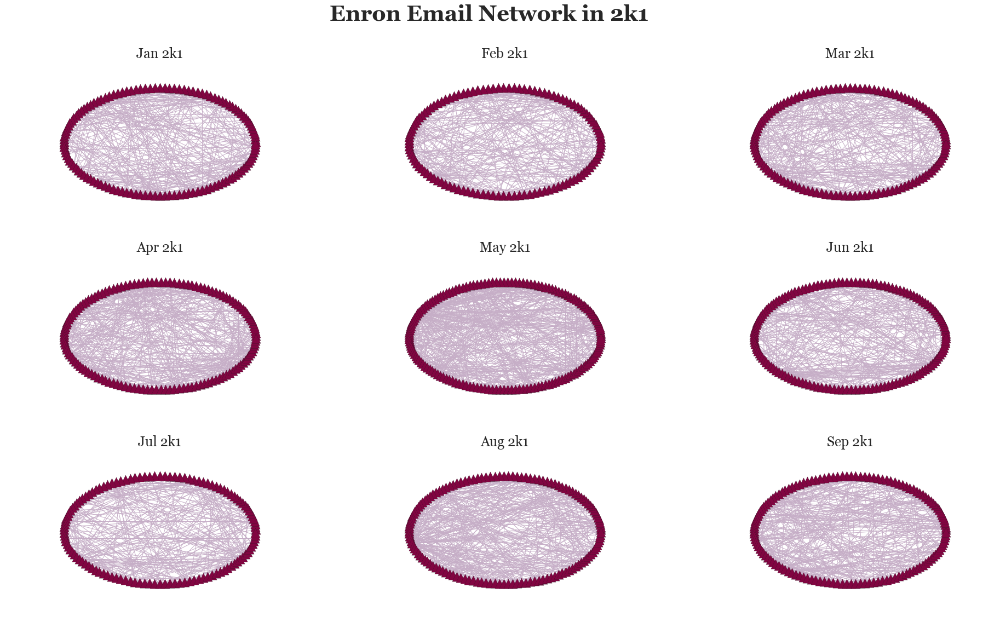

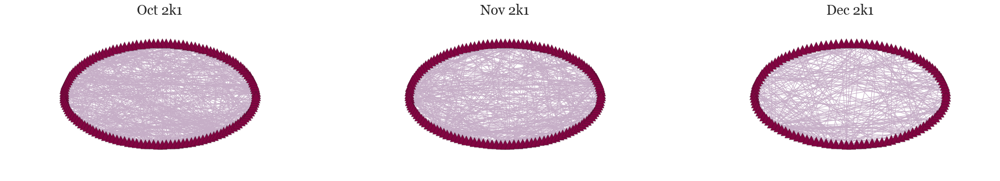

In [33]:
plt.figure(figsize=(32,18))
plt.suptitle("Enron Email Network in 2k1", fontsize=40)

plt.subplot(331)
plt.title("Jan 2k1", fontsize=25)
nx.draw_circular(G_jan_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(332)
plt.title("Feb 2k1", fontsize=25)
nx.draw_circular(G_feb_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(333)
plt.title("Mar 2k1", fontsize=25)
nx.draw_circular(G_mar_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(334)
plt.title("Apr 2k1", fontsize=25)
nx.draw_circular(G_apr_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(335)
plt.title("May 2k1", fontsize=25)
nx.draw_circular(G_may_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(336)
plt.title("Jun 2k1", fontsize=25)
nx.draw_circular(G_jun_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(337)
plt.title("Jul 2k1", fontsize=25)
nx.draw_circular(G_jul_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(338)
plt.title("Aug 2k1", fontsize=25)
nx.draw_circular(G_aug_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(339)
plt.title("Sep 2k1", fontsize=25)
nx.draw_circular(G_sep_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.figure(figsize=(32,5))
#plt.suptitle("Enron Email Network in 2k1", fontsize=40)

plt.subplot(131)
plt.title("Oct 2k1", fontsize=25)
nx.draw_circular(G_oct_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(132)
plt.title("Nov 2k1", fontsize=25)
nx.draw_circular(G_nov_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(133)
plt.title("Dec 2k1", fontsize=25)
nx.draw_circular(G_dec_2k1, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

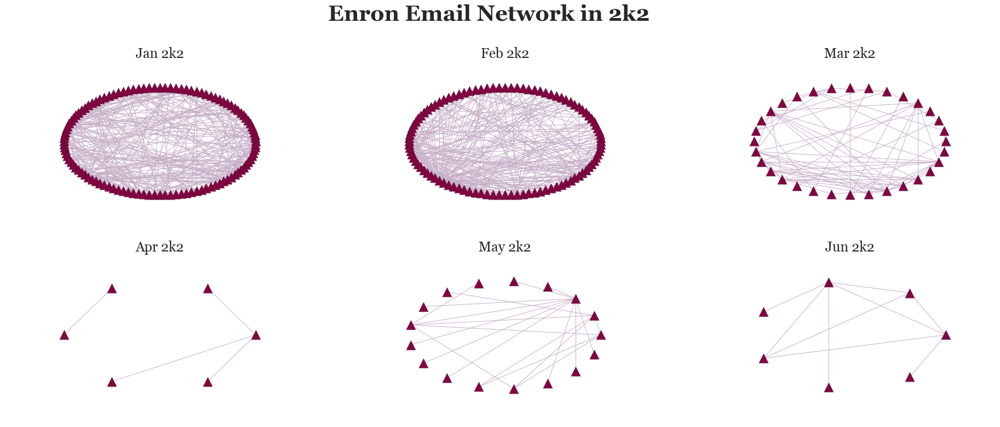

In [34]:
plt.figure(figsize=(32,18))
plt.suptitle("Enron Email Network in 2k2", fontsize=40)

plt.subplot(331)
plt.title("Jan 2k2", fontsize=25)
nx.draw_circular(G_jan_2k2, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(332)
plt.title("Feb 2k2", fontsize=25)
nx.draw_circular(G_feb_2k2, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(333)
plt.title("Mar 2k2", fontsize=25)
nx.draw_circular(G_mar_2k2, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(334)
plt.title("Apr 2k2", fontsize=25)
nx.draw_circular(G_apr_2k2, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(335)
plt.title("May 2k2", fontsize=25)
nx.draw_circular(G_may_2k2, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

plt.subplot(336)
plt.title("Jun 2k2", fontsize=25)
nx.draw_circular(G_jun_2k2, node_color='#810541',node_shape='^',edge_color ='#C6AEC7')

# Centrality and Assortativity Analysis

We look at some traditional network measures in this section for the networks both at the year and monthly level.

**Analysis Methodology**

1. Analyse network at the yearly level using centrality measures and other measures
    - Find top 5 nodes for each centrality measure across the years
2. Analyse network across years using averaged measures
3. Analyse network in monthly intervals using average centrality and other measures 
4. Compare yearly and monthly trends

*The specific measures used are:*

**Degree Centrality** 

Degree Centrality is defined as the number of links incident upon a node (i.e., the number of ties that a node has). The degree can be interpreted in terms of the immediate risk of a node for catching whatever is flowing through the network (such as a virus, or some information).

**Closeness Centrality**

The farness of a node x is defined as the sum of its distances from all other nodes, and its closeness was defined by the reciprocal of the farness.

**Betweenness Centrality**

Betweenness centrality quantifies the number of times a node acts as a bridge along the shortest path between two other nodes

**Eigenvector Centrality**

Eigenvector centrality (also called eigencentrality) is a measure of the influence of a node in a network. It assigns relative scores to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes.

**Katz Centrality**

Katz centrality measures the number of all nodes that can be connected through a path, while the contributions of distant nodes are penalized.

**Load Centrality**

The load centrality of a node is the fraction of all shortest paths that pass through that node.

**Density**

The ratio of the number of edges and the number of possible edges.

**Clustering Coefficient**

The local clustering of each node in a graph is the fraction of triangles that actually exist over all possible triangles in its neighborhood. The average clustering coefficient of a graph is the mean of local clusterings.

**Algebraic Connectivity**

By the definition of algebraic connectivity, the second smallest eigenvalue of the graph Laplacian is a lower bound on the
node connectivity. Increases in algebraic connectivity actually correspond to a decrease in node connectivity. This means that the networks are actually less robust with respect to node-connectivity as the algebraic connectivity increases. 

**References:**
1. [Centrality](https://en.wikipedia.org/wiki/Centrality)
2. [Algebraic Connectivity](http://ece-research.unm.edu/chaouki/PAPERS/Tech-Reports/SAND-Report-Byrne-Feddema-Abdallah.pdf)

## Centrality Analysis: Year

In [35]:
degC0, cloC0, betC0, eigC0,  katzC0, loadC0 = get_cent(Gt0)
degC1, cloC1, betC1, eigC1,  katzC1, loadC1 = get_cent(Gt1)
degC2, cloC2, betC2, eigC2,  katzC2, loadC2 = get_cent(Gt2)
degC3, cloC3, betC3, eigC3,  katzC3, loadC3 = get_cent(Gt3)
degC4, cloC4, betC4, eigC4,  katzC4, loadC4 = get_cent(Gt4)

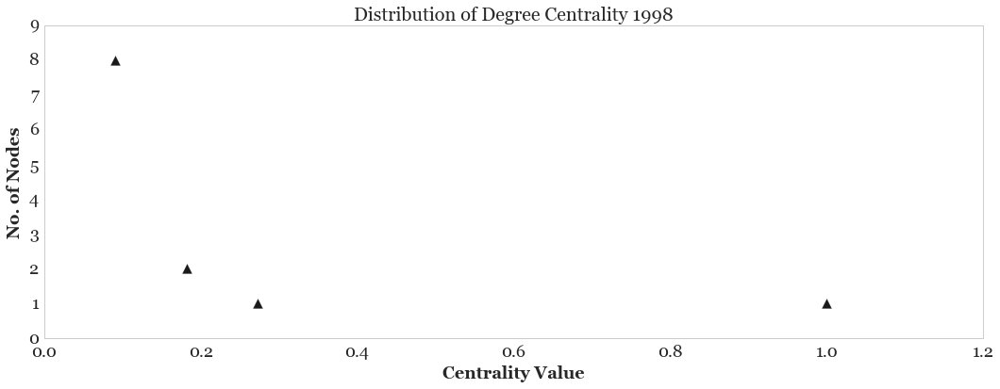

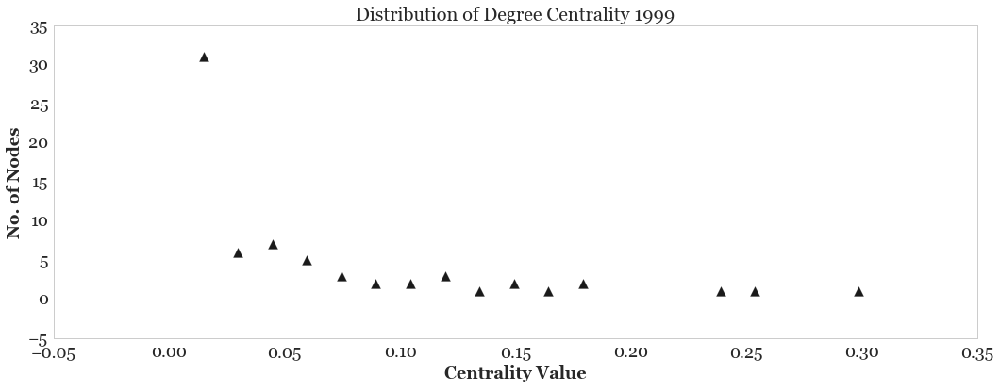

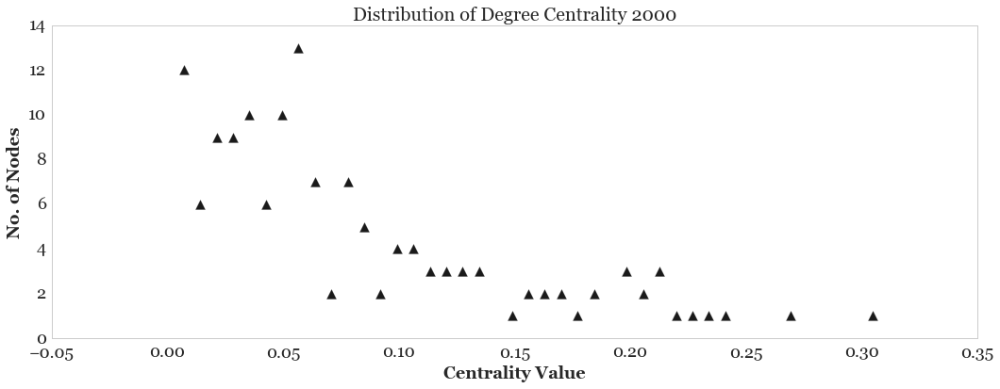

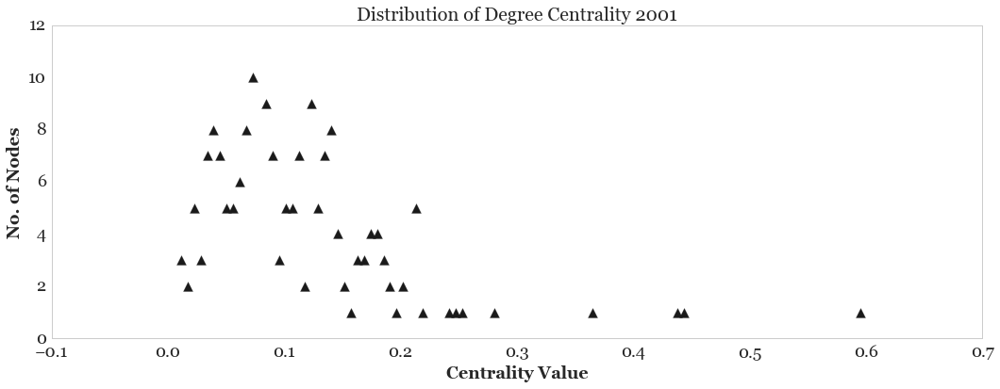

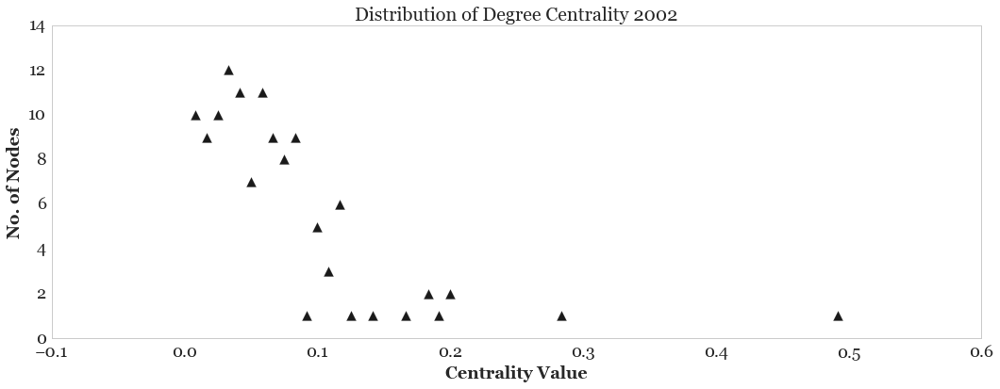

In [36]:
_,_= get_centhistval(degC0,'Degree Centrality 1998')
_,_= get_centhistval(degC1,'Degree Centrality 1999')
_,_= get_centhistval(degC2,'Degree Centrality 2000')
_,_= get_centhistval(degC3,'Degree Centrality 2001')
_,_= get_centhistval(degC4,'Degree Centrality 2002')

In [37]:
print("Top 5 Degree Centrality Nodes year 98")
get_top_keys(degC0,5)
print("Top 5 Degree Centrality Nodes year 99")
get_top_keys(degC1,5)
print("Top 5 Degree Centrality Nodes year 2k")
get_top_keys(degC2,5)
print("Top 5 Degree Centrality Nodes year 2k1")
get_top_keys(degC3,5)
print("Top 5 Degree Centrality Nodes year 2k2")
get_top_keys(degC4,5)

Top 5 Degree Centrality Nodes year 98
114
112
65
145
160
Top 5 Degree Centrality Nodes year 99
153
169
114
155
38
Top 5 Degree Centrality Nodes year 2k
82
27
140
157
78
Top 5 Degree Centrality Nodes year 2k1
82
153
107
94
126
Top 5 Degree Centrality Nodes year 2k2
105
107
82
90
159


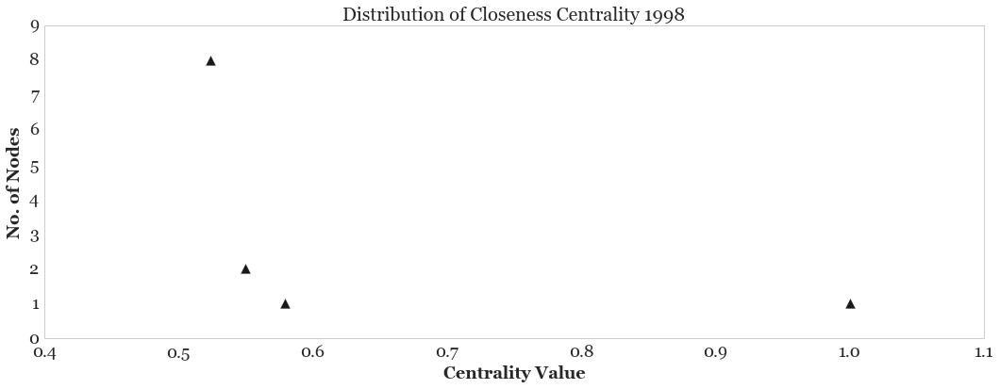

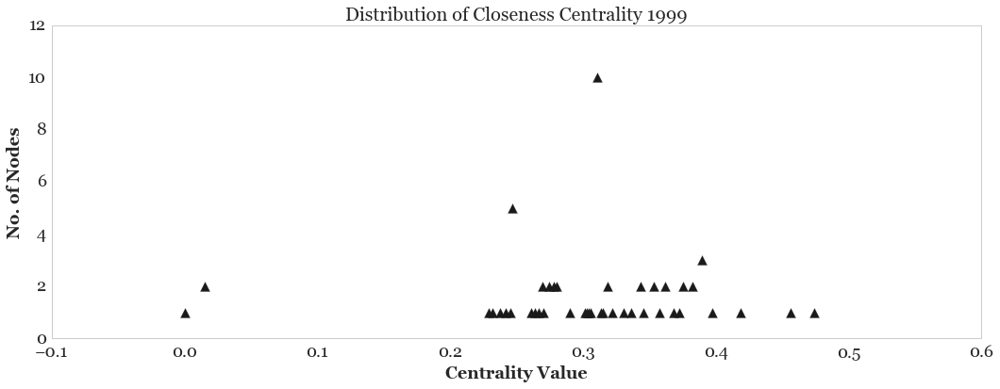

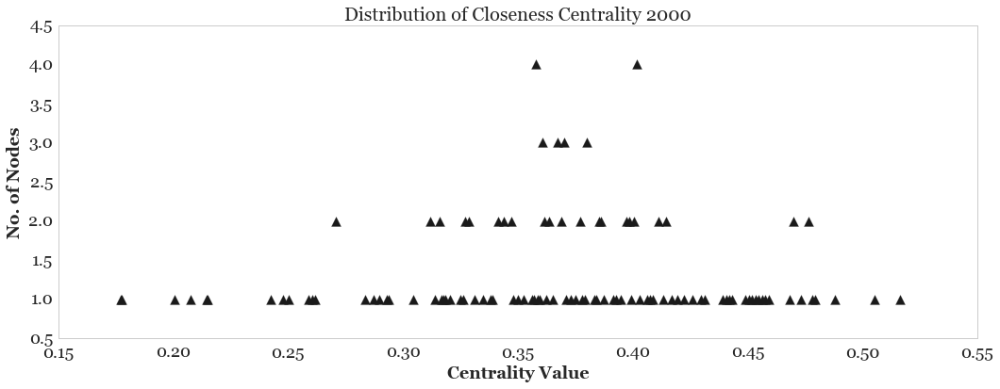

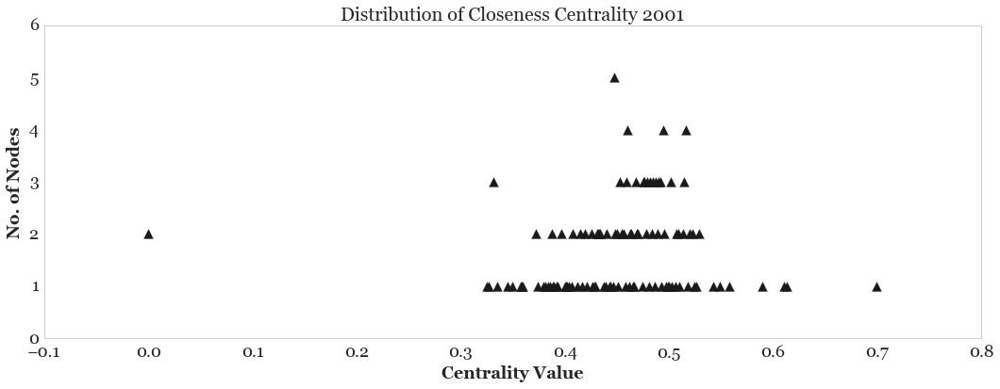

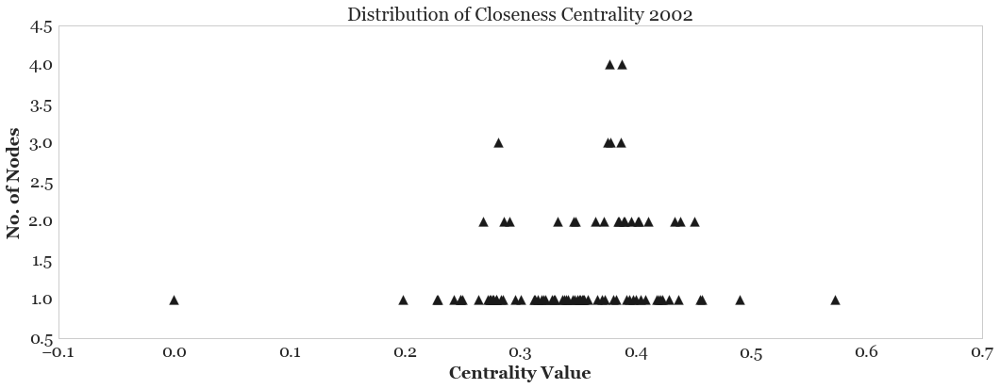

In [38]:
_,_= get_centhistval(cloC0,'Closeness Centrality 1998')
_,_= get_centhistval(cloC1,'Closeness Centrality 1999')
_,_= get_centhistval(cloC2,'Closeness Centrality 2000')
_,_= get_centhistval(cloC3,'Closeness Centrality 2001')
_,_= get_centhistval(cloC4,'Closeness Centrality 2002')

In [39]:
print("Top 5 Closeness Centrality Nodes year 98")
get_top_keys(cloC0,5)
print("Top 5 Closeness Centrality Nodes year 99")
get_top_keys(cloC1,5)
print("Top 5 Closeness Centrality Nodes year 2k")
get_top_keys(cloC2,5)
print("Top 5 Closeness Centrality Nodes year 2k1")
get_top_keys(cloC3,5)
print("Top 5 Closeness Centrality Nodes year 2k2")
get_top_keys(cloC4,5)

Top 5 Closeness Centrality Nodes year 98
114
112
65
145
160
Top 5 Closeness Centrality Nodes year 99
169
153
114
22
145
Top 5 Closeness Centrality Nodes year 2k
82
27
140
145
163
Top 5 Closeness Centrality Nodes year 2k1
82
153
107
94
126
Top 5 Closeness Centrality Nodes year 2k2
105
107
34
82
133


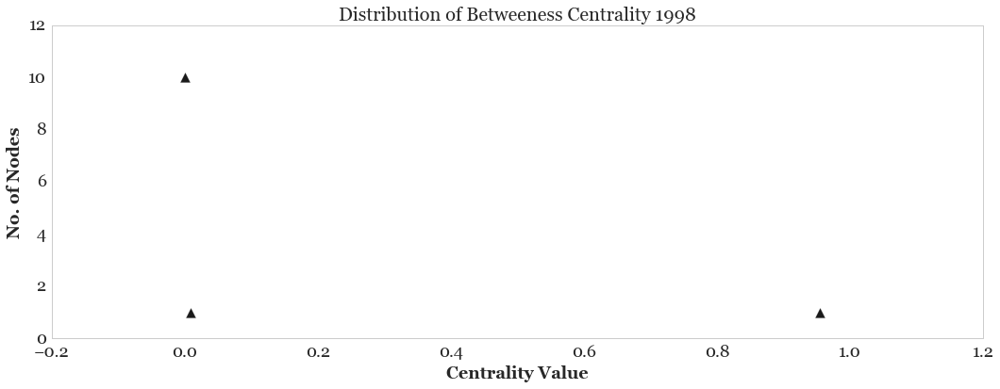

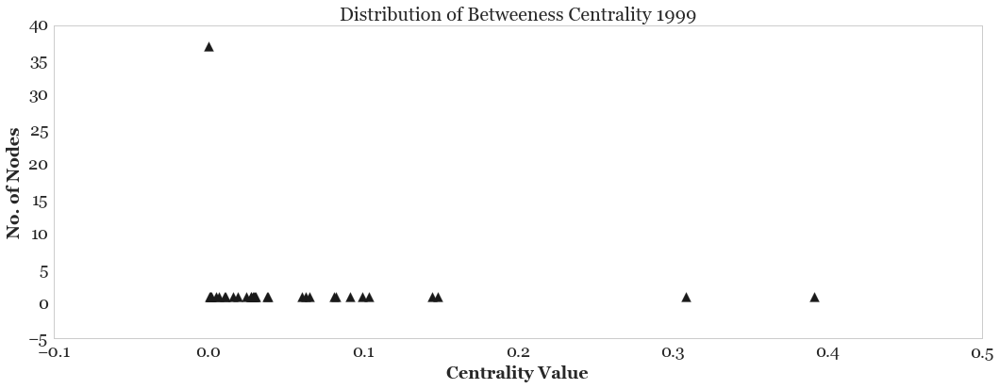

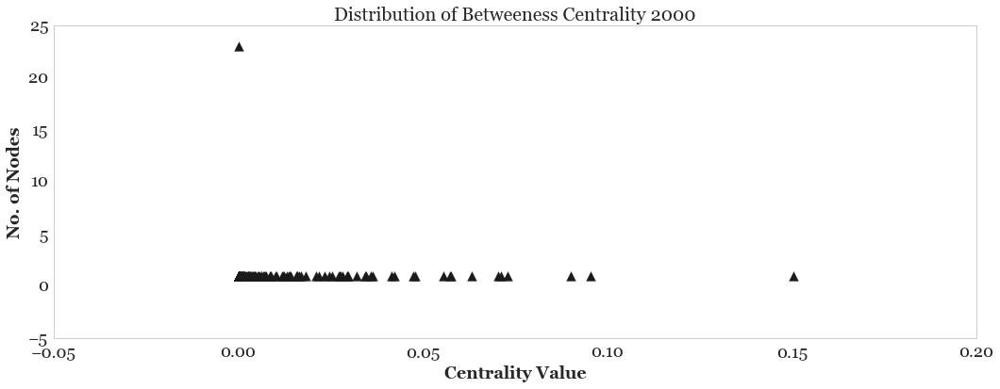

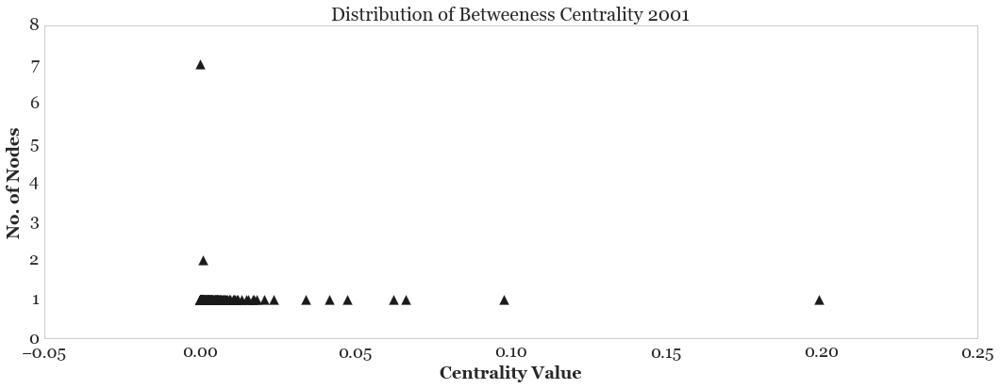

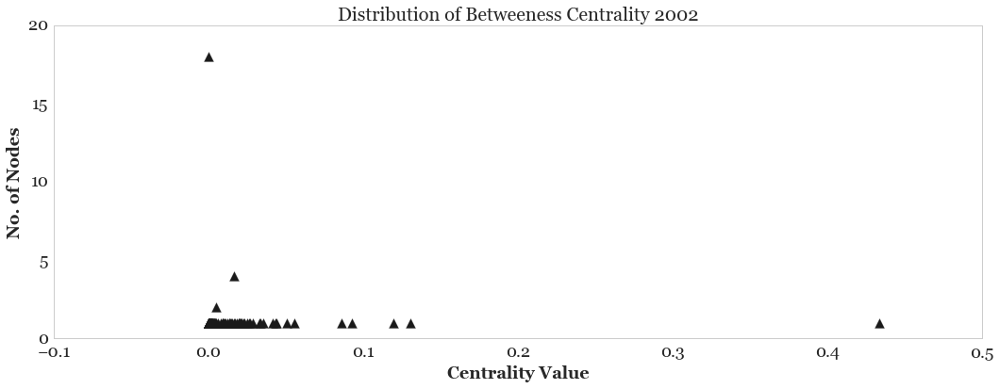

In [40]:
_,_= get_centhistval(betC0,'Betweeness Centrality 1998')
_,_= get_centhistval(betC1,'Betweeness Centrality 1999')
_,_= get_centhistval(betC2,'Betweeness Centrality 2000')
_,_= get_centhistval(betC3,'Betweeness Centrality 2001')
_,_= get_centhistval(betC4,'Betweeness Centrality 2002')

In [41]:
print("Top 5 Betweeness Centrality Nodes year 98")
get_top_keys(betC0,5)
print("Top 5 Betweeness Centrality Nodes year 99")
get_top_keys(betC1,5)
print("Top 5 Betweeness Centrality Nodes year 2k")
get_top_keys(betC2,5)
print("Top 5 Betweeness Centrality Nodes year 2k1")
get_top_keys(betC3,5)
print("Top 5 Betweeness Centrality Nodes year 2k2")
get_top_keys(betC4,5)

Top 5 Betweeness Centrality Nodes year 98
114
112
160
65
155
Top 5 Betweeness Centrality Nodes year 99
153
169
17
163
22
Top 5 Betweeness Centrality Nodes year 2k
82
63
140
157
79
Top 5 Betweeness Centrality Nodes year 2k1
82
153
94
107
9
Top 5 Betweeness Centrality Nodes year 2k2
105
34
107
158
17


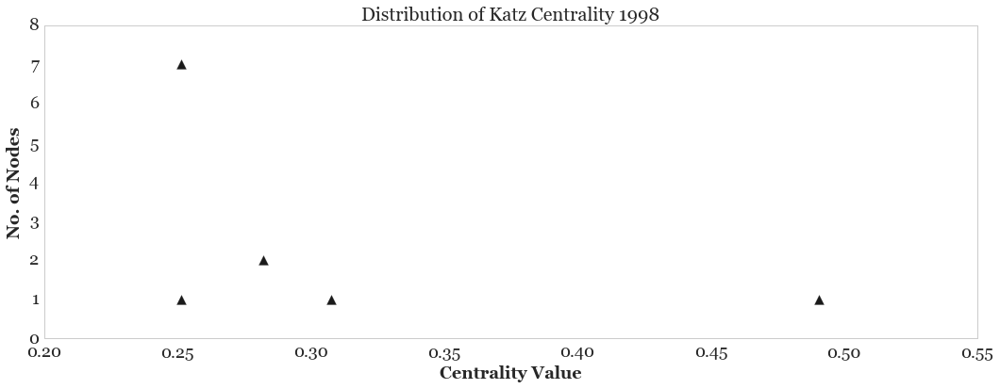

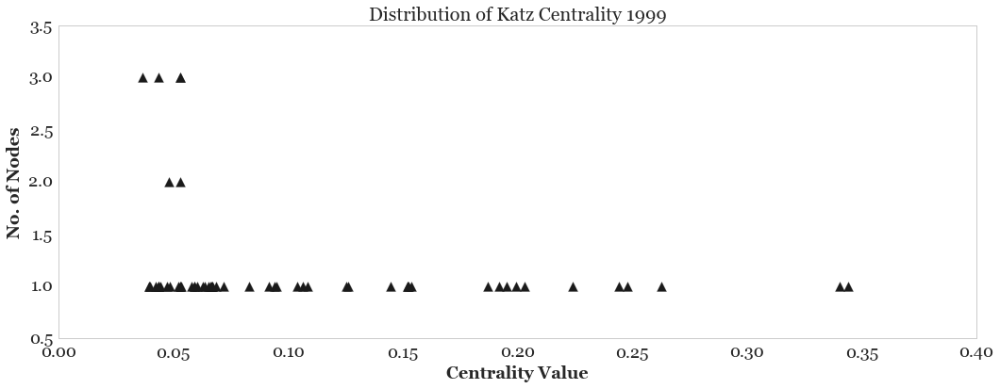

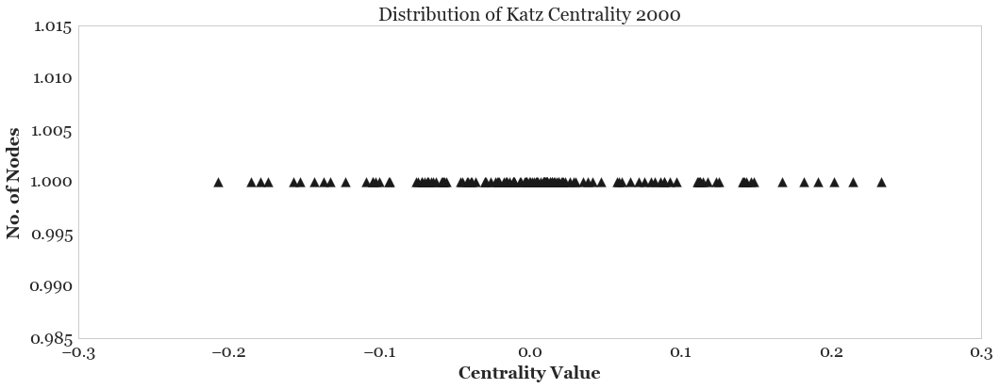

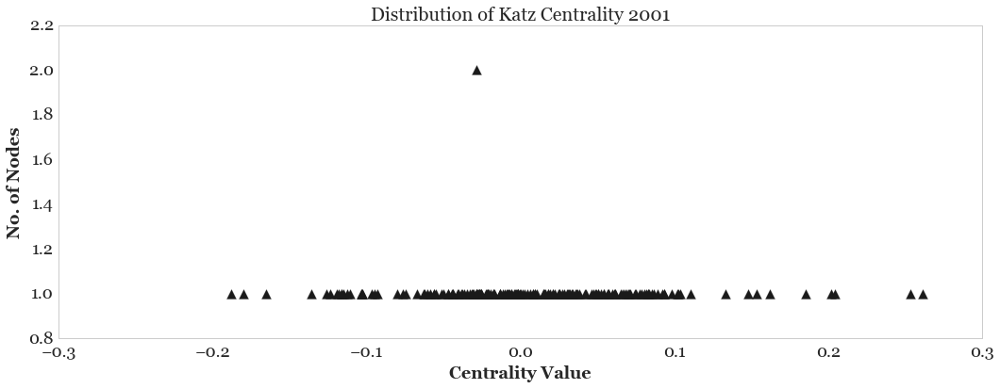

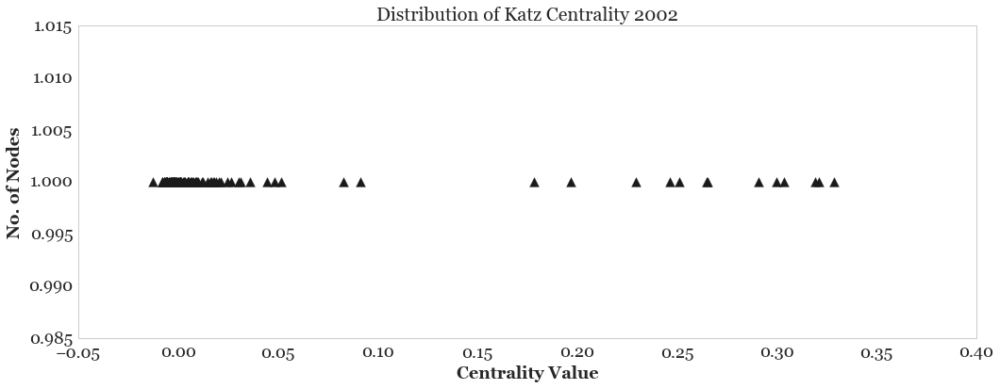

In [42]:
_,_= get_centhistval(katzC0,'Katz Centrality 1998')
_,_= get_centhistval(katzC1,'Katz Centrality 1999')
_,_= get_centhistval(katzC2,'Katz Centrality 2000')
_,_= get_centhistval(katzC3,'Katz Centrality 2001')
_,_= get_centhistval(katzC4,'Katz Centrality 2002')

In [43]:
print("Top 5 Katz Centrality Nodes year 98")
get_top_keys(katzC0,5)
print("Top 5 Katz Centrality Nodes year 99")
get_top_keys(katzC1,5)
print("Top 5 Katz Centrality Nodes year 2k")
get_top_keys(katzC2,5)
print("Top 5 Katz Centrality Nodes year 2k1")
get_top_keys(katzC3,5)
print("Top 5 Katz Centrality Nodes year 2k2")
get_top_keys(katzC4,5)

Top 5 Katz Centrality Nodes year 98
114
112
65
145
155
Top 5 Katz Centrality Nodes year 99
114
169
38
155
112
Top 5 Katz Centrality Nodes year 2k
114
169
33
158
155
Top 5 Katz Centrality Nodes year 2k1
167
133
32
153
21
Top 5 Katz Centrality Nodes year 2k2
98
103
124
158
108


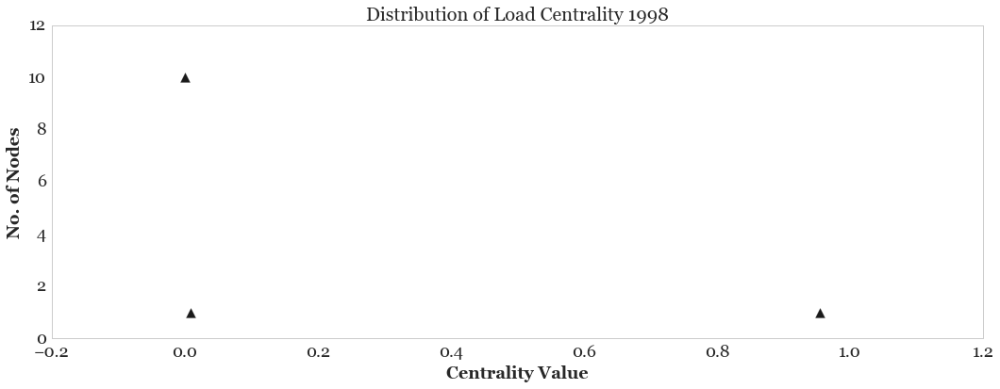

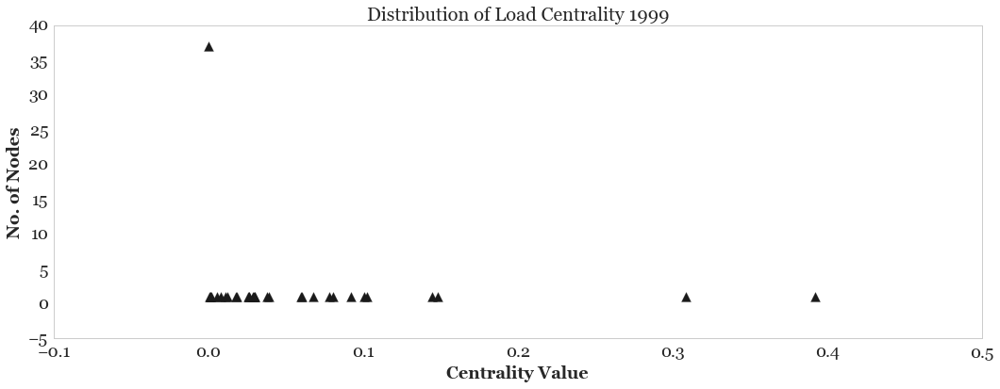

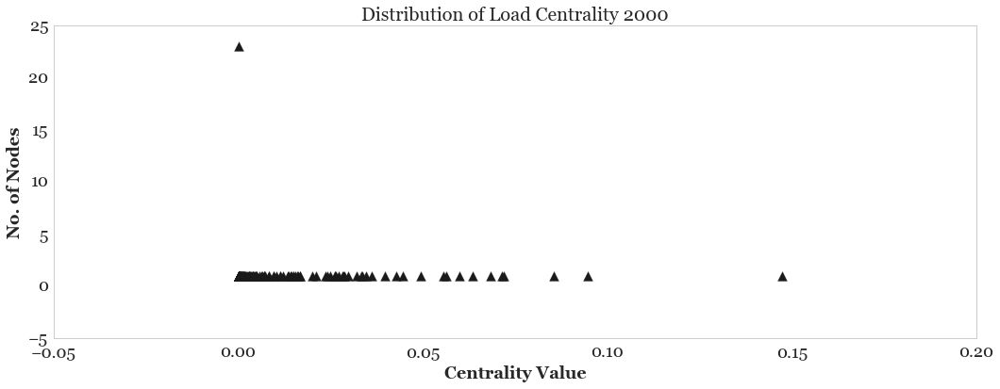

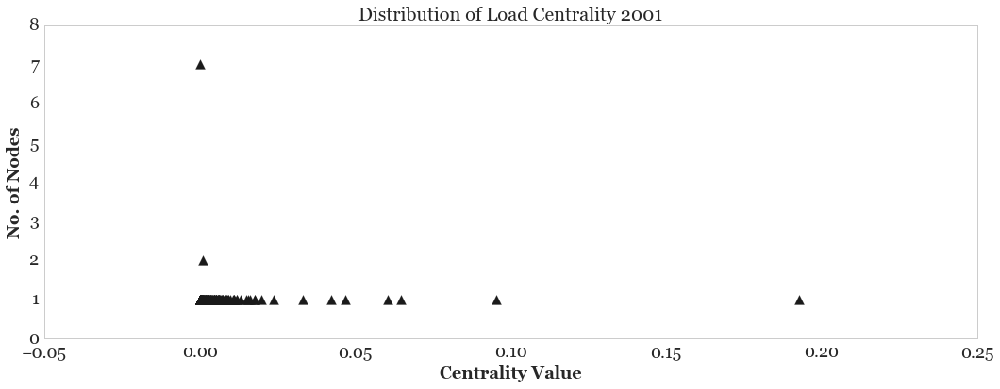

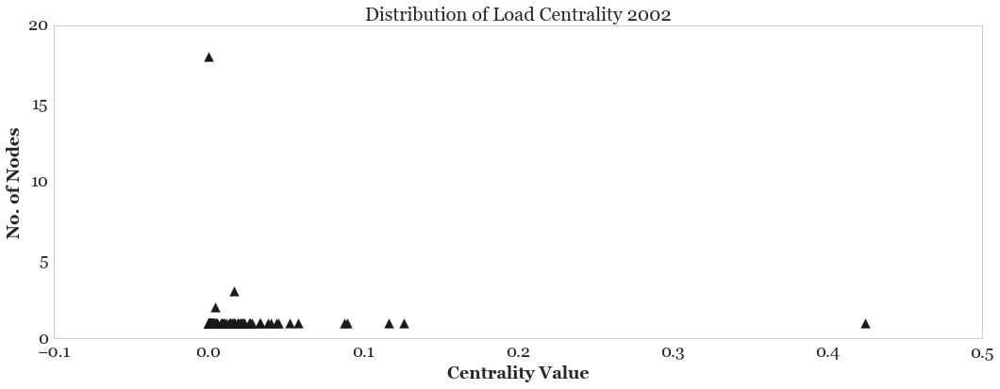

In [44]:
_,_= get_centhistval(loadC0,'Load Centrality 1998')
_,_= get_centhistval(loadC1,'Load Centrality 1999')
_,_= get_centhistval(loadC2,'Load Centrality 2000')
_,_= get_centhistval(loadC3,'Load Centrality 2001')
_,_= get_centhistval(loadC4,'Load Centrality 2002')

In [45]:
print("Top 5 Load Centrality Nodes year 98")
get_top_keys(loadC0,5)
print("Top 5 Load Centrality Nodes year 99")
get_top_keys(loadC1,5)
print("Top 5 Load Centrality Nodes year 2k")
get_top_keys(loadC2,5)
print("Top 5 Load Centrality Nodes year 2k1")
get_top_keys(loadC3,5)
print("Top 5 Load Centrality Nodes year 2k2")
get_top_keys(loadC4,5)

Top 5 Load Centrality Nodes year 98
114
112
160
65
155
Top 5 Load Centrality Nodes year 99
153
169
17
163
22
Top 5 Load Centrality Nodes year 2k
82
63
140
79
125
Top 5 Load Centrality Nodes year 2k1
82
153
94
107
9
Top 5 Load Centrality Nodes year 2k2
105
34
107
158
17


In [46]:
all_year_G  =tuple([Gt0,Gt1,Gt2,Gt3,Gt4])
all_year_G[:5]

(<networkx.classes.graph.Graph at 0x15f1b554be0>,
 <networkx.classes.graph.Graph at 0x15f17e7af60>)

In [47]:
density_year = []
avclustcoff_year = []
algebconn_year = []

for i in all_year_G:
    density_year.append(nx.density(i))
    avclustcoff_year.append(nx.average_clustering(i))
    algebconn_year.append(nx.algebraic_connectivity(i))

In [48]:
density_year

[0.19696969696969696,
 0.058384547848990345,
 0.07981220657276995,
 0.11179461427405687,
 0.06666666666666667]

In [49]:
avclustcoff_year

[0.22525252525252523,
 0.21497313000340684,
 0.4493480384358036,
 0.5037725950614431,
 0.4292464564453092]

In [50]:
algebconn_year

[1.0000000000000007, 0.0, 0.12190804467954622, 0.0, 0.0]

In [51]:
assorstat_year = pd.DataFrame([density_year,avclustcoff_year,algebconn_year]).T
assorstat_year.columns = ['Density','AvgClusteringCoff','AlgebraicConnect']
assorstat_year = assorstat_year.T
assorstat_year.columns = years[1:]
assorstat_year = assorstat_year.T
assorstat_year

,Density,AvgClusteringCoff,AlgebraicConnect
1998,0.196970,0.225253,1.000000
1999,0.058385,0.214973,0.000000
2000,0.079812,0.449348,0.121908
2001,0.111795,0.503773,0.000000
2002,0.066667,0.429246,0.000000


(array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4]),
 <a list of 8 Text yticklabel objects>)

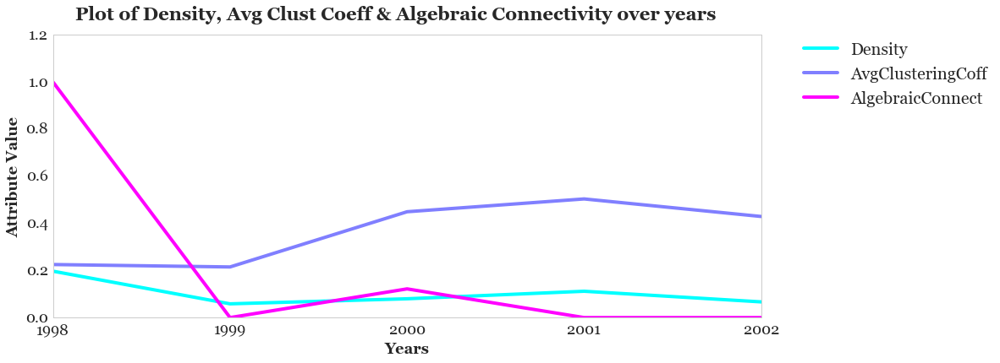

In [52]:
assorstat_year.plot(fontsize=18, cmap='cool', use_index=True)
plt.suptitle("Plot of Density, Avg Clust Coeff & Algebraic Connectivity over years", fontsize=22)
plt.xlabel("Years", fontsize=18)
plt.ylabel("Attribute Value", fontsize=18)
plt.legend(fontsize=20, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=18)
plt.yticks(fontsize=18)

(array([-1. , -0.5,  0. ,  0.5,  1. ,  1.5]),
 <a list of 6 Text yticklabel objects>)

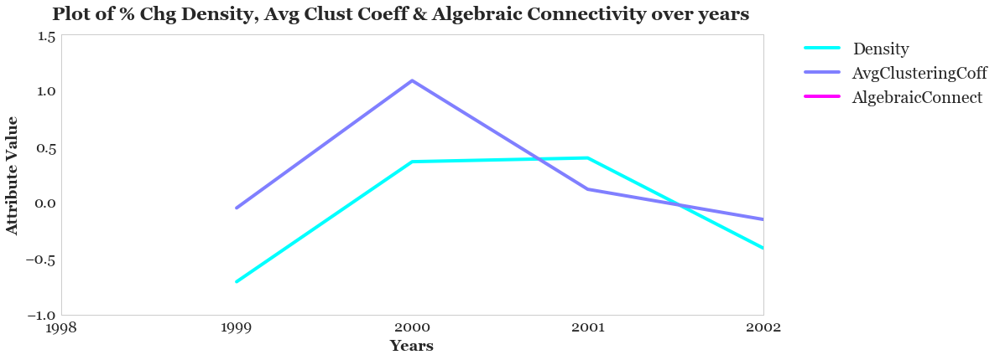

In [53]:
assorstat_year.pct_change().plot(fontsize=18, cmap='cool', use_index=True)
plt.suptitle("Plot of % Chg Density, Avg Clust Coeff & Algebraic Connectivity over years", fontsize=22)
plt.xlabel("Years", fontsize=18)
plt.ylabel("Attribute Value", fontsize=18)
plt.legend(fontsize=20, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=18)
plt.yticks(fontsize=18)

In [54]:
print("No. of edges 2000 and 2001: \n", nx.number_of_edges(Gt2),nx.number_of_edges(Gt3))
print("No. of nodes 2000 and 2001: \n",  nx.number_of_nodes(Gt2),nx.number_of_nodes(Gt3))


No. of edges 2000 and 2001: 
 799 1781
No. of nodes 2000 and 2001: 
 142 179


## Calculate average of attributes for yearly networks

In [55]:
y_avgst0 = cal_avgstat(Gt0)
y_avgst1 = cal_avgstat(Gt1)
y_avgst2 = cal_avgstat(Gt2)
y_avgst3 = cal_avgstat(Gt3)
y_avgst4 = cal_avgstat(Gt4)

y_avgst_all = y_avgst0.append(y_avgst1).append(y_avgst2).append(y_avgst3).append(y_avgst4)
y_avgst_all = y_avgst_all.T 
y_avgst_all.columns = years[1:]
y_avgst_all = y_avgst_all.T 

(array([ 0.  ,  0.05,  0.1 ,  0.15,  0.2 ,  0.25,  0.3 ,  0.35]),
 <a list of 8 Text yticklabel objects>)

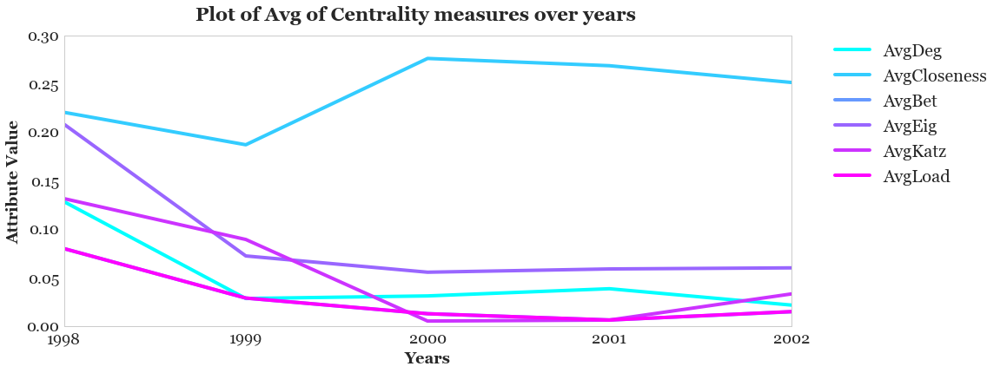

In [56]:
y_avgst_all.iloc[:,:6].plot(fontsize=18, cmap='cool')
plt.suptitle("Plot of Avg of Centrality measures over years", fontsize=22)
plt.xlabel("Years", fontsize=18)
plt.ylabel("Attribute Value", fontsize=18)
plt.legend(fontsize=20, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=18)
plt.yticks(fontsize=18)

(array([  1.00000000e-04,   1.00000000e-03,   1.00000000e-02,
          1.00000000e-01,   1.00000000e+00,   1.00000000e+01]),
 <a list of 6 Text yticklabel objects>)

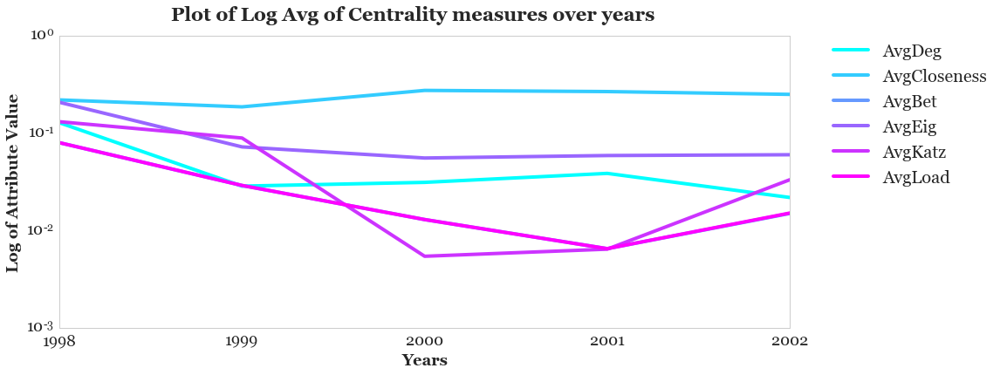

In [57]:
y_avgst_all.iloc[:,:6].plot(fontsize=18, cmap='cool', logy=True)
plt.suptitle("Plot of Log Avg of Centrality measures over years", fontsize=22)
plt.xlabel("Years", fontsize=18)
plt.ylabel("Log of Attribute Value", fontsize=18)
plt.legend(fontsize=20, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=18)
plt.yticks(fontsize=18)

(array([-1.,  0.,  1.,  2.,  3.,  4.,  5.]),
 <a list of 7 Text yticklabel objects>)

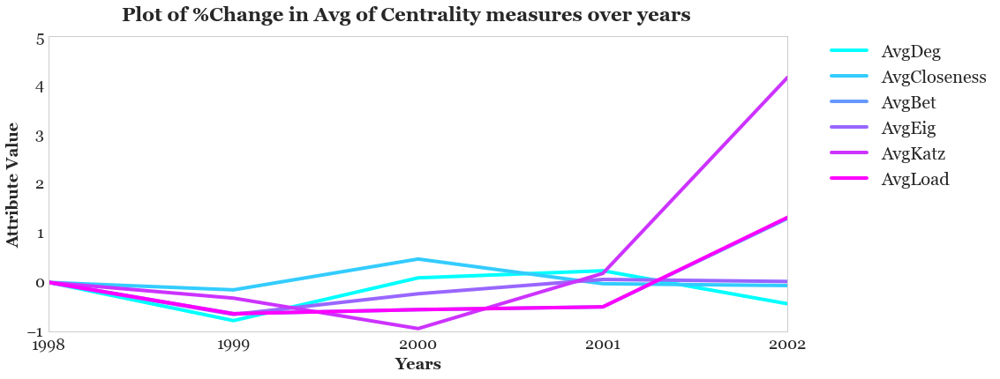

In [58]:
y_avgst_all.iloc[:,:6].pct_change().fillna(0).plot(fontsize=18, cmap='cool')
plt.suptitle("Plot of %Change in Avg of Centrality measures over years", fontsize=22)
plt.xlabel("Years", fontsize=18)
plt.ylabel("Attribute Value", fontsize=18)
plt.legend(fontsize=20, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=18)
plt.yticks(fontsize=18)

## Observations

The algebraic connectivity > 0 indicates that the network is connected so excluding the first network the only other time that this measure indicates that the network is connected is in 2000. This is the first signal that emerges from these set of measures. From the percentage change plot we see that the year 2000 experiences the largest increase in density and clustering coefficient. The density implies that more edges that could be formed are formed in the network in 2000 as opposed to the other years. While the density is largely similar between 2000 and 2001 the local average clustering coefficient decreases between 2000 and 2001 this could largely be down to the larger network size. This means that although the network has grown the number of triangles has decreased due to much higher number of edges between nodes.

From the average of the centrality measures we see a similar signal across the years. We see that 2000 again experiences a big change compared to the previous years. The Closeness Centrality dominates due to its scale but in the log plot we see that the Closeness Centrality changes the most for this year before almost flat lining for the remaining years. The Degree centrality confirms the observationsregarding the density because we see only marginal change in the Degree Centrality between 2000 and 2001. The Eigenvector Centrality tells us that the power structure or the influence structure in the network did not change much within the network over this time period. However, the Katz centrality and Load centrality are much more interesting. The Katz centrality is an indicator of node importance and from 2000 it seems that there was an increase in the number average number of influential nodes and the path between them decreased as indicated by the falling Load centrality. They coincide in 2001 just at the end of the Golden age of Enron. The rising Katz and Load Centrality can be interepreted as the involvement of outside actors as the accounting scandal unfolded leading to more influential players in the network. Hence Load and Katz Centrality experience a largest percentage increase during this time. 


## Monthly Analysis

Calculate average statistics for monthly networks

In [59]:
stat_nov98 = cal_avgstat(G_nov98)
stat_dec98 = cal_avgstat(G_dec98)
stat98= stat_nov98.append(stat_dec98).T
stat98.columns = ['Nov98','Dec98']
stat98.head()

,Nov98,Dec98
AvgDeg,0.142857,0.145455
AvgCloseness,0.192308,0.242737
AvgBet,0.125000,0.086869
AvgEig,0.222019,0.233760
AvgKatz,0.185435,0.175111


In [60]:
stat_jan_99=cal_avgstat(G_jan_99)
stat_feb_99=cal_avgstat(G_feb_99)
stat_mar_99=cal_avgstat(G_mar_99)
stat_apr_99=cal_avgstat(G_apr_99)
stat_may_99=cal_avgstat(G_may_99)
stat_jun_99=cal_avgstat(G_jun_99)
stat_jul_99=cal_avgstat(G_jul_99)
stat_aug_99=cal_avgstat(G_aug_99)
stat_sep_99=cal_avgstat(G_sep_99)
stat_oct_99=cal_avgstat(G_oct_99)
stat_nov_99=cal_avgstat(G_nov_99)
stat_dec_99=cal_avgstat(G_dec_99)

stat_99 = stat_jan_99.append(stat_feb_99).append(stat_mar_99).append(stat_apr_99).append(stat_may_99)
stat_99 = stat_99.append(stat_jun_99).append(stat_jul_99).append(stat_aug_99).append(stat_sep_99)
stat_99 = stat_99.append(stat_oct_99).append(stat_nov_99).append(stat_dec_99).T
stat_99.columns = ['jan_99','feb_99','mar_99','apr_99','may_99','jun_99','jul_99','aug_99','sep_99','oct_99','nov_99','dec_99']
stat_99.head()

,jan_99,feb_99,mar_99,apr_99,may_99,jun_99,jul_99,aug_99,sep_99,oct_99,nov_99,dec_99
AvgDeg,0.083333,0.500000,0.200000,0.500000,0.120879,0.066176,0.094771,0.088745,0.071146,0.070769,0.085714,0.025689
AvgCloseness,0.117057,0.555556,0.259259,0.555556,0.372644,0.157004,0.295189,0.223778,0.275119,0.169032,0.179564,0.147367
AvgBet,0.076923,0.333333,0.166667,0.333333,0.110806,0.028922,0.100490,0.057143,0.077734,0.028803,0.051128,0.038836
AvgEig,0.132902,0.569036,0.328670,0.569036,0.224884,0.166311,0.189606,0.142963,0.152945,0.127862,0.147848,0.069662
AvgKatz,0.057692,0.390223,0.277684,0.390223,0.263068,0.191024,0.221168,0.183912,0.189669,0.172447,0.194931,0.106213


In [61]:
stat_jan_2k=cal_avgstat(G_jan_2k)
stat_feb_2k=cal_avgstat(G_feb_2k)
stat_mar_2k=cal_avgstat(G_mar_2k)
stat_apr_2k=cal_avgstat(G_apr_2k)
stat_may_2k=cal_avgstat(G_may_2k)
stat_jun_2k=cal_avgstat(G_jun_2k)
stat_jul_2k=cal_avgstat(G_jul_2k)
stat_aug_2k=cal_avgstat(G_aug_2k)
stat_sep_2k=cal_avgstat(G_sep_2k)
stat_oct_2k=cal_avgstat(G_oct_2k)
stat_nov_2k=cal_avgstat(G_nov_2k)
stat_dec_2k=cal_avgstat(G_dec_2k)

stat_2k = stat_jan_2k.append(stat_feb_2k).append(stat_mar_2k).append(stat_apr_2k).append(stat_may_2k)
stat_2k = stat_2k.append(stat_jun_2k).append(stat_jul_2k).append(stat_aug_2k).append(stat_sep_2k)
stat_2k = stat_2k.append(stat_oct_2k).append(stat_nov_2k).append(stat_dec_2k).T
stat_2k.columns = ['jan_2k','feb_2k','mar_2k','apr_2k','may_2k','jun_2k','jul_2k','aug_2k','sep_2k','oct_2k','nov_2k','dec_2k']
stat_2k.head()

,jan_2k,feb_2k,mar_2k,apr_2k,may_2k,jun_2k,jul_2k,aug_2k,sep_2k,oct_2k,nov_2k,dec_2k
AvgDeg,0.022378,0.026626,0.014809,0.010464,0.014035,0.010867,0.012697,0.016514,0.012147,0.018086,0.010884,0.013887
AvgCloseness,0.165628,0.208593,0.157985,0.113773,0.164460,0.192022,0.206035,0.223131,0.192691,0.222388,0.177589,0.174585
AvgBet,0.034948,0.035326,0.046531,0.042264,0.033091,0.027877,0.026787,0.017815,0.019417,0.019777,0.017789,0.019199
AvgEig,0.066998,0.084335,0.065003,0.053698,0.071458,0.068502,0.068311,0.063361,0.062015,0.062537,0.054661,0.051451
AvgKatz,0.099556,0.104652,0.097354,0.103359,0.104188,0.091210,0.086094,0.068437,0.073747,0.064164,0.058620,0.038943


In [62]:
stat_jan_2k1=cal_avgstat(G_jan_2k1)
stat_feb_2k1=cal_avgstat(G_feb_2k1)
stat_mar_2k1=cal_avgstat(G_mar_2k1)
stat_apr_2k1=cal_avgstat(G_apr_2k1)
stat_may_2k1=cal_avgstat(G_may_2k1)
stat_jun_2k1=cal_avgstat(G_jun_2k1)
stat_jul_2k1=cal_avgstat(G_jul_2k1)
stat_aug_2k1=cal_avgstat(G_aug_2k1)
stat_sep_2k1=cal_avgstat(G_sep_2k1)
stat_oct_2k1=cal_avgstat(G_oct_2k1)
stat_nov_2k1=cal_avgstat(G_nov_2k1)
stat_dec_2k1=cal_avgstat(G_dec_2k1)

stat_2k1 = stat_jan_2k1.append(stat_feb_2k1).append(stat_mar_2k1).append(stat_apr_2k1).append(stat_may_2k1)
stat_2k1 = stat_2k1.append(stat_jun_2k1).append(stat_jul_2k1).append(stat_aug_2k1).append(stat_sep_2k1)
stat_2k1 = stat_2k1.append(stat_oct_2k1).append(stat_nov_2k1).append(stat_dec_2k1).T
stat_2k1.columns = ['jan_2k1','feb_2k1','mar_2k1','apr_2k1','may_2k1','jun_2k1','jul_2k1','aug_2k1','sep_2k1','oct_2k1','nov_2k1','dec_2k1']
stat_2k1.head()

,jan_2k1,feb_2k1,mar_2k1,apr_2k1,may_2k1,jun_2k1,jul_2k1,aug_2k1,sep_2k1,oct_2k1,nov_2k1,dec_2k1
AvgDeg,0.013179,0.012052,0.012982,0.015607,0.012401,0.008815,0.016036,0.016639,0.012930,0.019379,0.016612,0.011789
AvgCloseness,0.191559,0.208446,0.186307,0.214056,0.221824,0.209019,0.199306,0.247621,0.195912,0.232163,0.241737,0.202481
AvgBet,0.017710,0.021867,0.017525,0.017928,0.011548,0.019936,0.020539,0.015186,0.021407,0.012743,0.017048,0.022688
AvgEig,0.055170,0.064686,0.058794,0.051914,0.052995,0.049033,0.053660,0.051803,0.051584,0.058570,0.056969,0.065293
AvgKatz,0.048244,0.074620,0.057339,0.002995,0.022108,0.059015,0.046579,0.000057,0.021531,0.003949,0.002392,0.074214


In [63]:
stat_jan_2k2=cal_avgstat(G_jan_2k2)
stat_feb_2k2=cal_avgstat(G_feb_2k2)
stat_mar_2k2=cal_avgstat(G_mar_2k2)
stat_apr_2k2=cal_avgstat(G_apr_2k2)
stat_may_2k2=cal_avgstat(G_may_2k2)
stat_jun_2k2=cal_avgstat(G_jun_2k2)

stat_2k2 = stat_jan_2k2.append(stat_feb_2k2).append(stat_mar_2k2).append(stat_apr_2k2).append(stat_may_2k2).append(stat_jun_2k2).T
stat_2k2.columns = ['jan_2k2','feb_2k2','mar_2k2','apr_2k2','may_2k2','jun_2k2']
stat_2k2.head()

,jan_2k2,feb_2k2,mar_2k2,apr_2k2,may_2k2,jun_2k2
AvgDeg,0.018018,0.021818,0.049395,0.200000,0.106618,0.357143
AvgCloseness,0.191514,0.193146,0.133727,0.193333,0.234243,0.462193
AvgBet,0.022664,0.022488,0.033737,0.050000,0.094118,0.133333
AvgEig,0.055595,0.065612,0.108396,0.306719,0.172235,0.336275
AvgKatz,0.042359,0.046586,0.131887,0.277666,0.212198,0.273203


In [64]:
stat_all = stat98.join(stat_99).join(stat_2k).join(stat_2k1).join(stat_2k2).T

In [65]:
months = list(stat_all.index)

(array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7]),
 <a list of 8 Text yticklabel objects>)

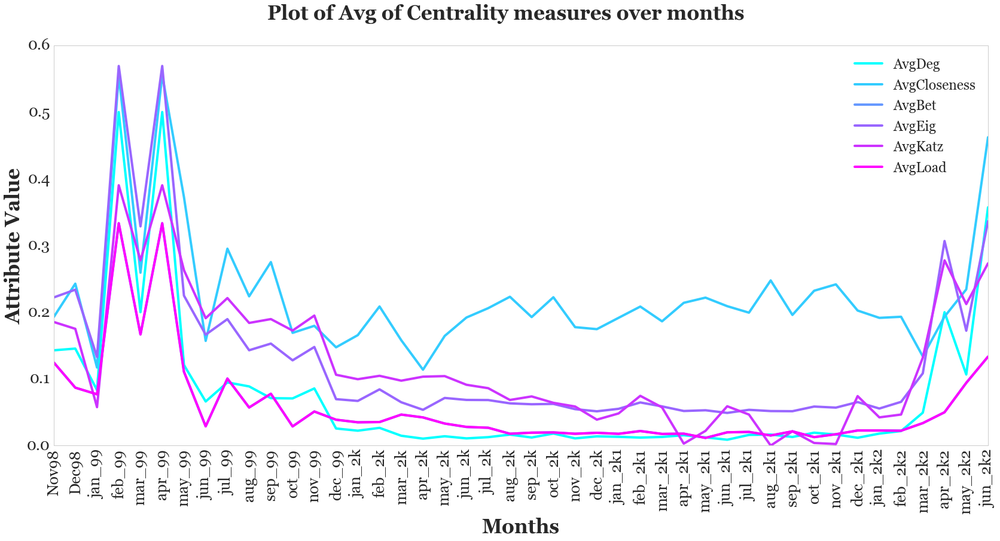

In [66]:
stat_all.iloc[:,:6].plot(fontsize=22, cmap='cool', rot=90, figsize=(28,12))
plt.suptitle("Plot of Avg of Centrality measures over months", fontsize=33)
plt.xlabel("Months", fontsize=33)
plt.ylabel("Attribute Value", fontsize=33)
plt.legend(fontsize=23, loc=1)
#plt.legend(fontsize=20, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

## Comparison of Yearly and Monthly trends in Centrality

(array([  1.00000000e-06,   1.00000000e-05,   1.00000000e-04,
          1.00000000e-03,   1.00000000e-02,   1.00000000e-01,
          1.00000000e+00,   1.00000000e+01]),
 <a list of 8 Text yticklabel objects>)

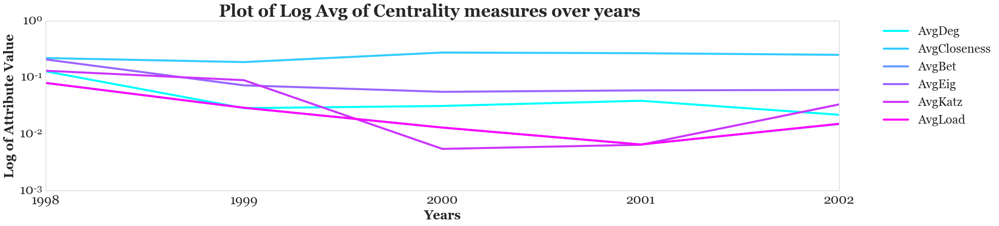

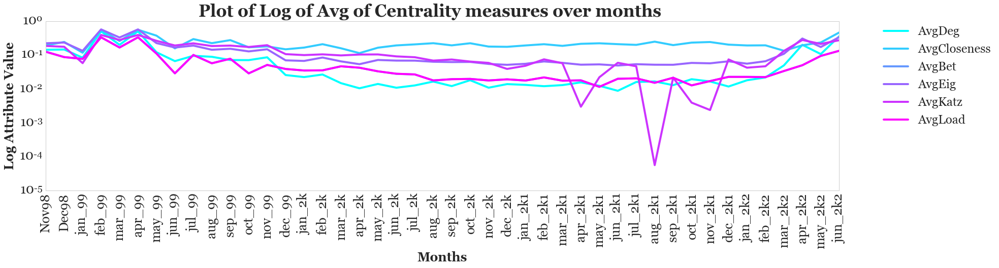

In [67]:
y_avgst_all.iloc[:,:6].plot(fontsize=22, cmap='cool', figsize=(28,6),logy=True)
plt.suptitle("Plot of Log Avg of Centrality measures over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Log of Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)

stat_all.iloc[:,:6].plot(fontsize=22, cmap='cool', rot=90, figsize=(28,6), logy=True)
plt.suptitle("Plot of Log of Avg of Centrality measures over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Log Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

(array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4]),
 <a list of 8 Text yticklabel objects>)

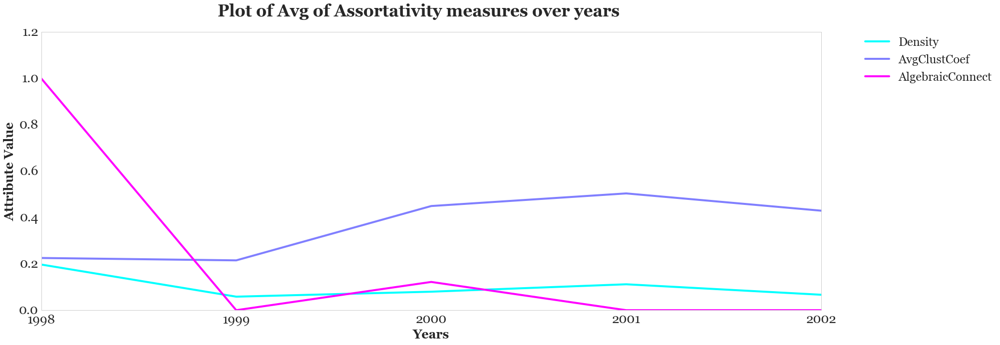

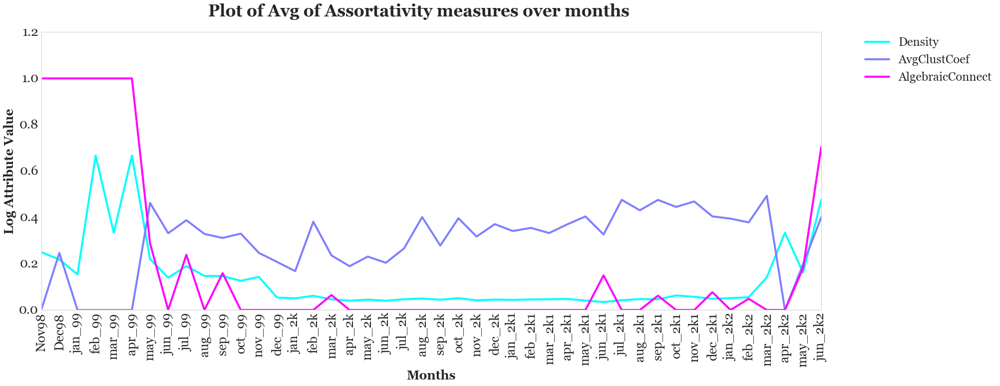

In [68]:
y_avgst_all.iloc[:,6:9].plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Avg of Assortativity measures over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)

stat_all.iloc[:,6:9].plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Avg of Assortativity measures over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Log Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

# Attributes Analysis on Graphs

Here I implement novel attributes taken from seismic data analysis. 

These attributes are:
+ Instantaneous Phase
+ Instantaneous Amplitude
+ Instantatneous Frequency
+ Gaussian Curvature
+ Energy Envelope
+ First Derivative of Energy Envelope
+ Second Derivative of Energy Envelope
+ Standardized Kernel PCA 3 Component Ratio Correlation Average



## Mean Curvature

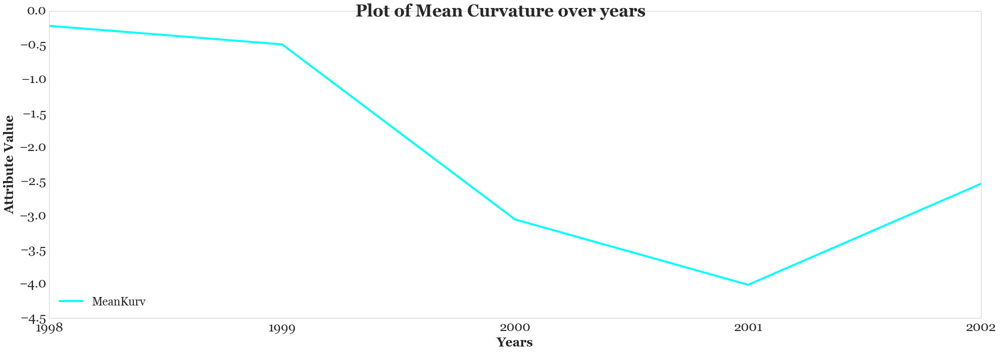

In [69]:
y_avgst_all.MeanKurv.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Mean Curvature over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([-3. , -2.5, -2. , -1.5, -1. , -0.5,  0. ]),
 <a list of 7 Text yticklabel objects>)

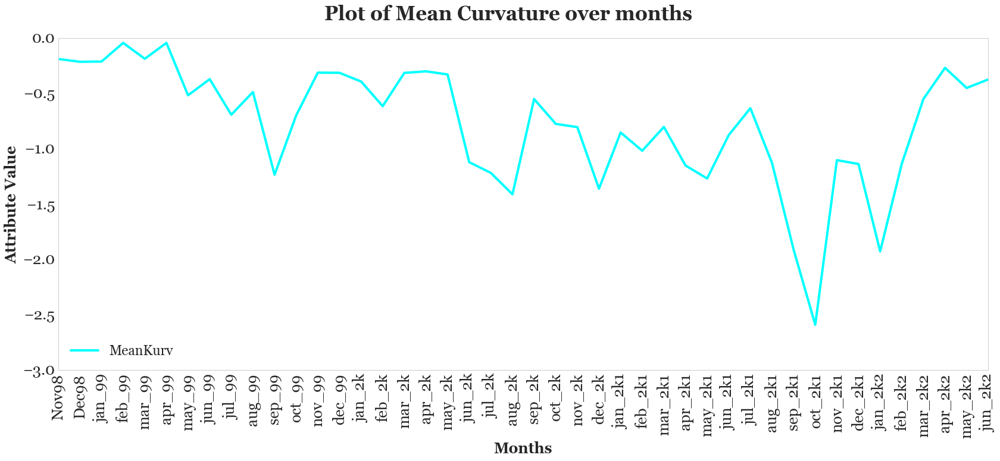

In [70]:
stat_all.MeanKurv.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Mean Curvature over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

## Instantaneous Amplitude

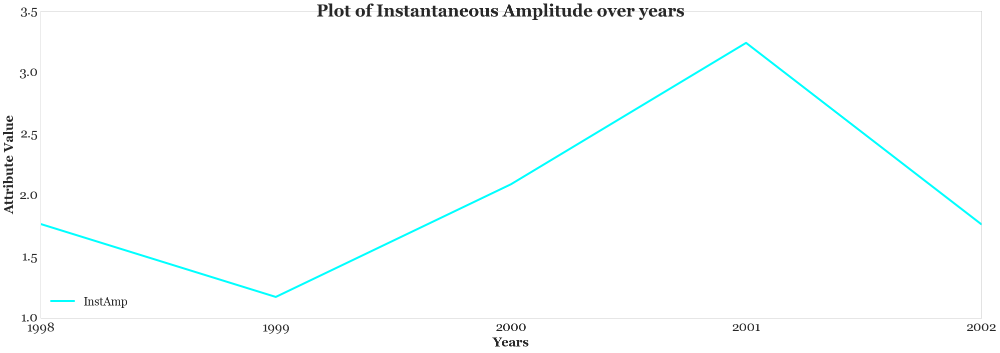

In [71]:
y_avgst_all.InstAmp.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Instantaneous Amplitude over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([ 0.8,  1. ,  1.2,  1.4,  1.6,  1.8,  2. ,  2.2,  2.4]),
 <a list of 9 Text yticklabel objects>)

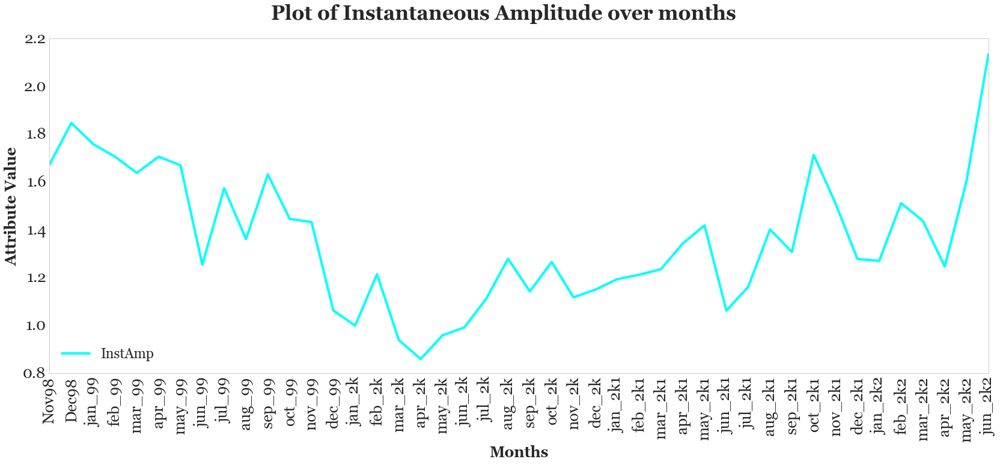

In [72]:
stat_all.InstAmp.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Instantaneous Amplitude over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

## Instantaneous Frequency

In [73]:
y_avgst_all.head()

,AvgDeg,AvgCloseness,AvgBet,AvgEig,AvgKatz,AvgLoad,Density,AvgClustCoef,AlgebraicConnect,MeanKurv,InstAmp,InstPhase,InstFreq,EnergyEnv,dEnergyEnv,d2EnergyEnv,MeanResistanceDist,StatRat
1998,0.128788,0.221063,0.080303,0.208801,0.131932,0.080303,0.196970,0.225253,1.000000,-0.216510,1.766118,0.270574,0.056460,1.766118,0.000574,0.003564,1.472222,0.921324
1999,0.028753,0.187570,0.029206,0.072719,0.089714,0.029206,0.058385,0.214973,0.000000,-0.488245,1.172330,0.050987,0.001945,1.172330,0.005961,0.000558,1.477600,0.942222
2000,0.031415,0.276721,0.013034,0.055911,0.005469,0.013034,0.079812,0.449348,0.121908,-3.054759,2.089703,-0.100461,0.006673,2.089703,-0.003446,-0.009389,0.665711,0.972985
2001,0.038855,0.269216,0.006547,0.059285,0.006471,0.006546,0.111795,0.503773,0.000000,-4.011850,3.241031,0.119350,0.005588,3.241031,0.021406,-0.006877,0.184468,0.982998
2002,0.021970,0.251953,0.015063,0.060401,0.033446,0.015204,0.066667,0.429246,0.000000,-2.529783,1.764620,-0.000316,0.002542,1.764620,0.017243,0.000799,0.737679,0.966308


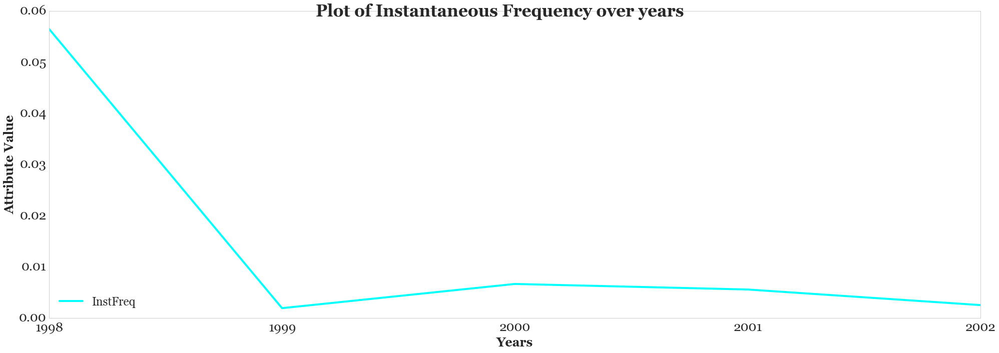

In [74]:
y_avgst_all.InstFreq.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Instantaneous Frequency over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([-0.1 , -0.05,  0.  ,  0.05,  0.1 ,  0.15,  0.2 ,  0.25,  0.3 ,  0.35]),
 <a list of 10 Text yticklabel objects>)

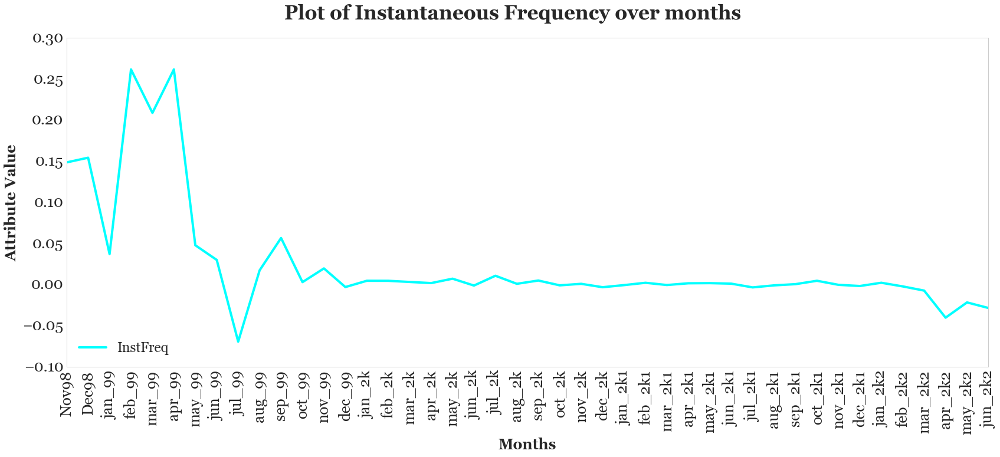

In [75]:
stat_all.InstFreq.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Instantaneous Frequency over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

## Instantaneous Phase

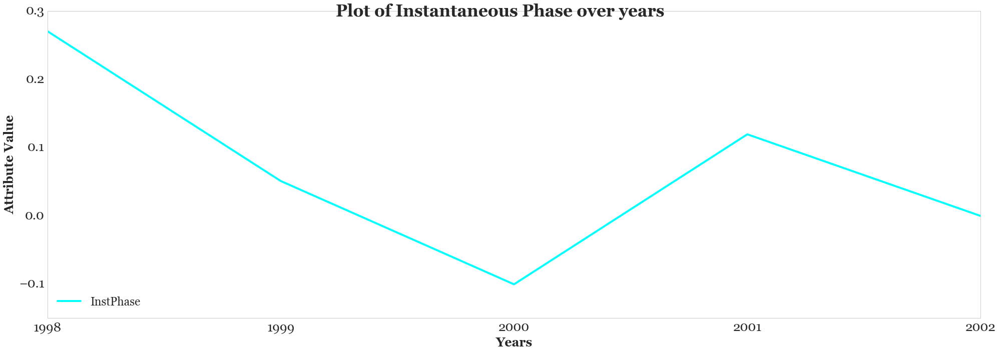

In [76]:
y_avgst_all.InstPhase.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Instantaneous Phase over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([-0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7]),
 <a list of 9 Text yticklabel objects>)

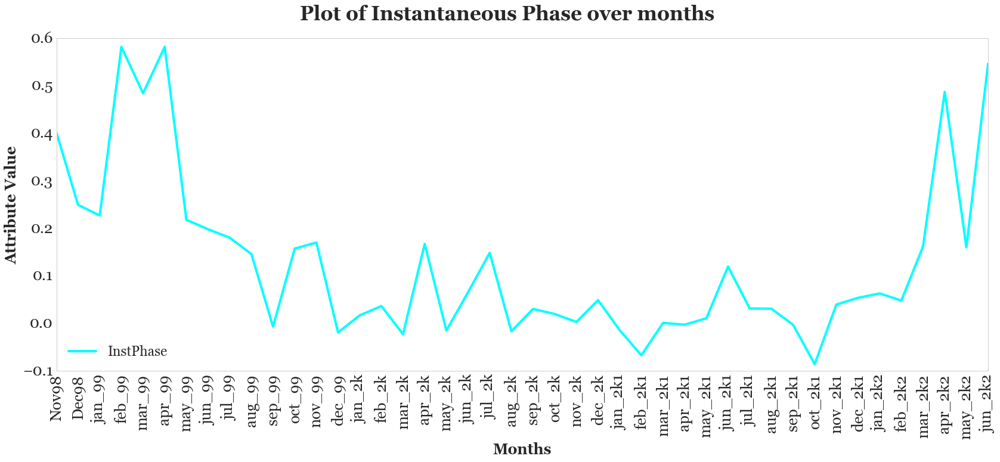

In [77]:
stat_all.InstPhase.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Instantaneous Phase over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

## Energy Envelope

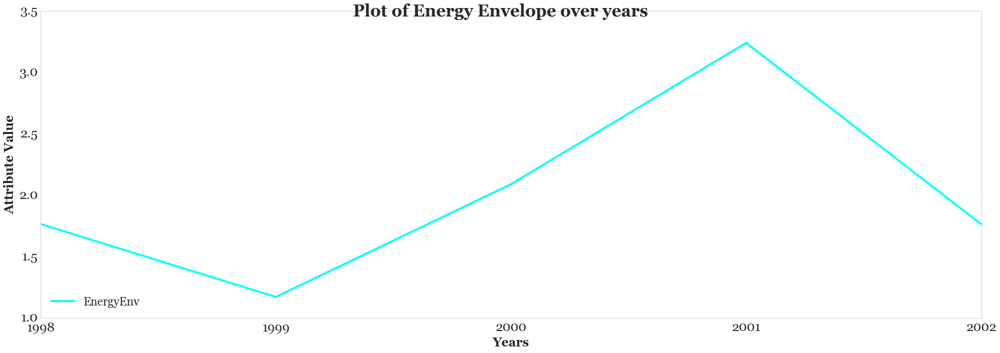

In [78]:
y_avgst_all.EnergyEnv.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Energy Envelope over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([ 0.8,  1. ,  1.2,  1.4,  1.6,  1.8,  2. ,  2.2,  2.4]),
 <a list of 9 Text yticklabel objects>)

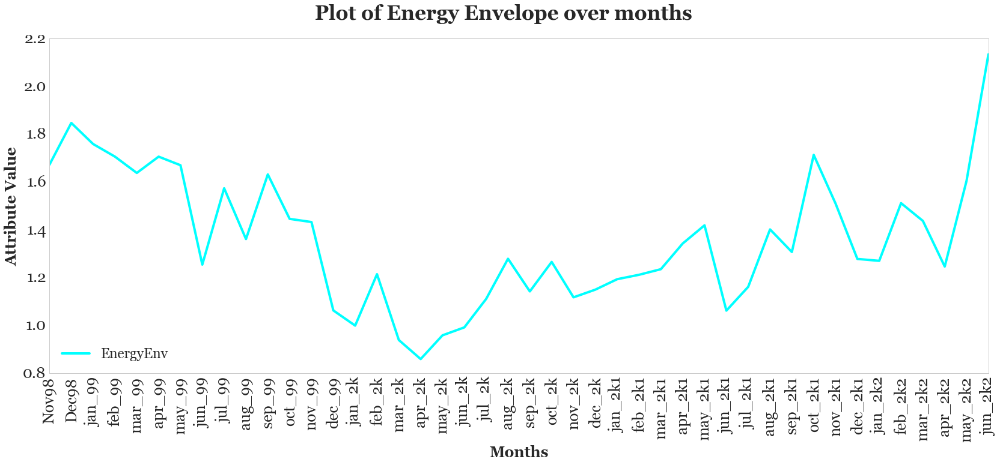

In [79]:
stat_all.EnergyEnv.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Energy Envelope over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

## First derivative of Energy Envelope

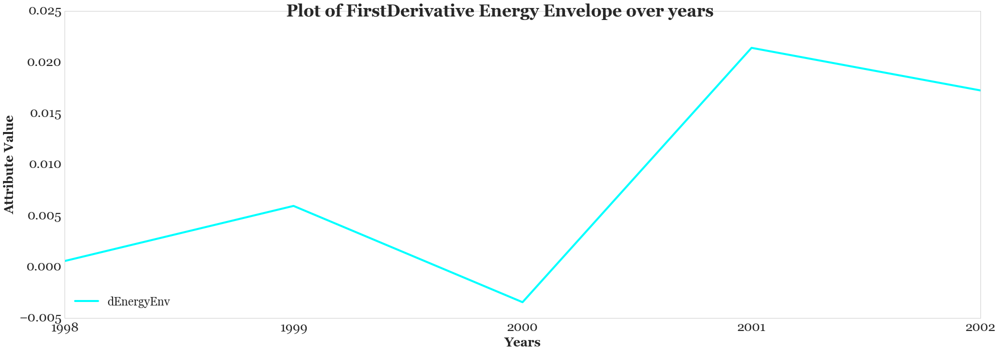

In [80]:
y_avgst_all.dEnergyEnv.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of FirstDerivative Energy Envelope over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([-0.25, -0.2 , -0.15, -0.1 , -0.05,  0.  ,  0.05,  0.1 ,  0.15,  0.2 ]),
 <a list of 10 Text yticklabel objects>)

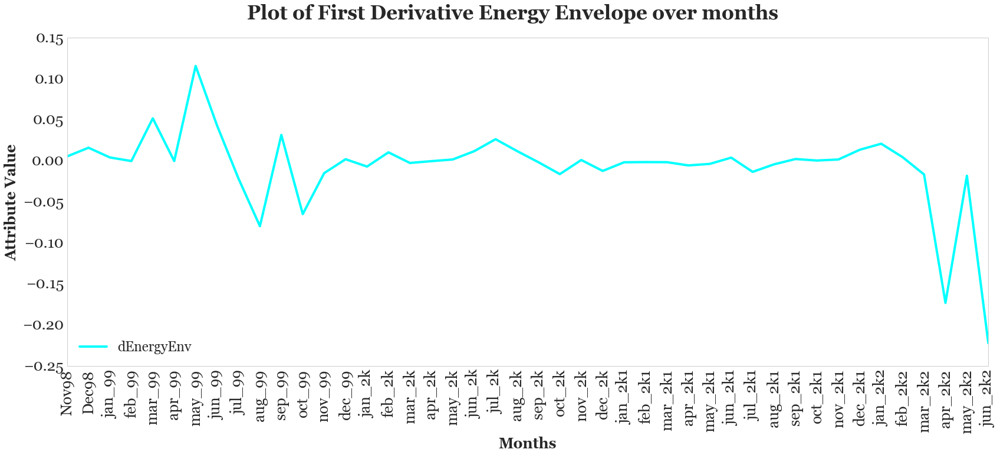

In [81]:
stat_all.dEnergyEnv.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of First Derivative Energy Envelope over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

## Second Derivative of Energy Envelope

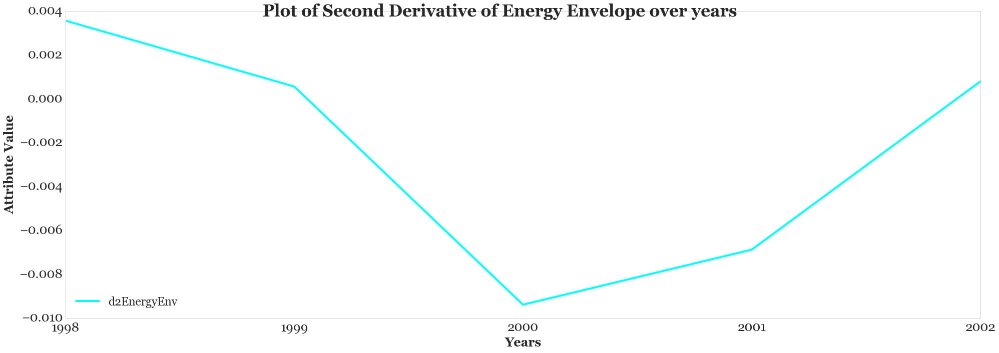

In [82]:
y_avgst_all.d2EnergyEnv.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Second Derivative of Energy Envelope over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([-0.7, -0.6, -0.5, -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2]),
 <a list of 10 Text yticklabel objects>)

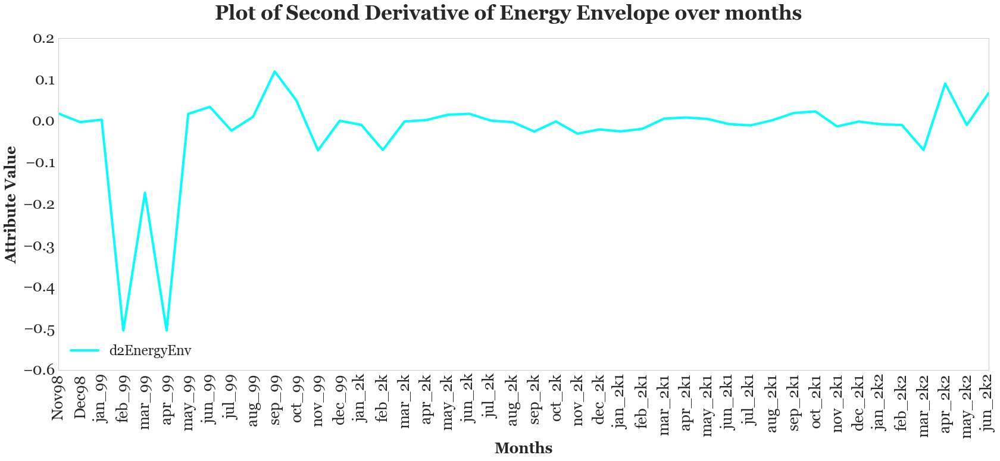

In [83]:
stat_all.d2EnergyEnv.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Second Derivative of Energy Envelope over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

## Standardized Kernel PCA 3 Component Ratio Correlation Average

In [84]:
y_avg_klpca3_corr = []
for i in range(0,len(all_year_G)-1):
    x = int(i)
    y = x +1
    y_avg_klpca3_corr.append(avg_klpca_corr(all_year_G[x],all_year_G[y]))

In [85]:
y_avg_klpca3_corr

[4.5930542491021935,
 13.804565118469903,
 25.917084139404828,
 16.034547524962807]

In [86]:
tmp = np.zeros(5)
tmp[1:] = y_avg_klpca3_corr
tmp[1:] = (tmp[1:] - np.mean(tmp[1:]))/np.std(tmp[1:])
tmp

array([ 0.        , -1.38407391, -0.16917989,  1.42832426,  0.12492954])

In [87]:
all_month_G = tuple([G_nov98,G_dec98,G_jan_99,G_feb_99,G_mar_99,G_apr_99,G_may_99,G_jun_99,G_jul_99,G_aug_99,G_sep_99,G_oct_99,\
              G_nov_99,G_dec_99,G_jan_2k,G_feb_2k,G_mar_2k,G_apr_2k,G_may_2k,G_jun_2k,G_jul_2k,G_aug_2k,G_sep_2k,\
              G_oct_2k,G_nov_2k,G_dec_2k,G_jan_2k1,G_feb_2k1,G_mar_2k1,G_apr_2k1,G_may_2k1,G_jun_2k1,G_jul_2k1,\
              G_aug_2k1,G_sep_2k1,G_oct_2k1,G_nov_2k1,G_dec_2k1,G_jan_2k2,G_feb_2k2,G_mar_2k2,G_apr_2k2,G_may_2k2,G_jun_2k2])

In [88]:
m_avg_klpca3_corr = []
for i in range(0,len(all_month_G)-1):
    x = int(i)
    y = x +1
    m_avg_klpca3_corr.append(avg_klpca_corr(all_month_G[x],all_month_G[y]))

In [89]:
m_avg_klpca3_corr[:5]

[-797.64345338943622,
 -148.92608738423382,
 -125.90323416913407,
 -21.172277856343158,
 -21.172277856343158]

In [90]:
tmp2 = np.zeros(len(m_avg_klpca3_corr)+1)
tmp2[1:] = m_avg_klpca3_corr
tmp2[1:] = (tmp2[1:] - np.mean(tmp2[1:]))/np.std(tmp2[1:])
tmp2[:5]

array([ 0.        , -6.25943175, -1.01217929, -0.82595532,  0.0211775 ])

In [91]:
y_avgst_all['StdKLPCA_MeanCorr']= tmp
y_avgst_all.iloc[:,9:]

,MeanKurv,InstAmp,InstPhase,InstFreq,EnergyEnv,dEnergyEnv,d2EnergyEnv,MeanResistanceDist,StatRat,StdKLPCA_MeanCorr
1998,-0.216510,1.766118,0.270574,0.056460,1.766118,0.000574,0.003564,1.472222,0.921324,0.000000
1999,-0.488245,1.172330,0.050987,0.001945,1.172330,0.005961,0.000558,1.477600,0.942222,-1.384074
2000,-3.054759,2.089703,-0.100461,0.006673,2.089703,-0.003446,-0.009389,0.665711,0.972985,-0.169180
2001,-4.011850,3.241031,0.119350,0.005588,3.241031,0.021406,-0.006877,0.184468,0.982998,1.428324
2002,-2.529783,1.764620,-0.000316,0.002542,1.764620,0.017243,0.000799,0.737679,0.966308,0.124930


In [92]:
stat_all['StdKLPCA_MeanCorr']=tmp2
stat_all.iloc[:,9:].head()

,MeanKurv,InstAmp,InstPhase,InstFreq,EnergyEnv,dEnergyEnv,d2EnergyEnv,MeanResistanceDist,StatRat,StdKLPCA_MeanCorr
Nov98,-0.186746,1.673053,0.402325,0.148795,1.673053,5.621093e-03,0.018756,1.531250,0.894427,0.000000
Dec98,-0.211928,1.847590,0.249824,0.154485,1.847590,1.620420e-02,-0.001828,1.425620,0.915335,-6.259432
jan_99,-0.209616,1.759445,0.227285,0.037372,1.759445,4.349704e-03,0.003884,1.704142,0.930949,-1.012179
feb_99,-0.041280,1.706667,0.582231,0.261799,1.706667,2.467162e-17,-0.504323,0.888889,0.774597,-0.825955
mar_99,-0.184845,1.638536,0.484553,0.208991,1.638536,5.201336e-02,-0.172138,1.388889,0.866025,0.021177


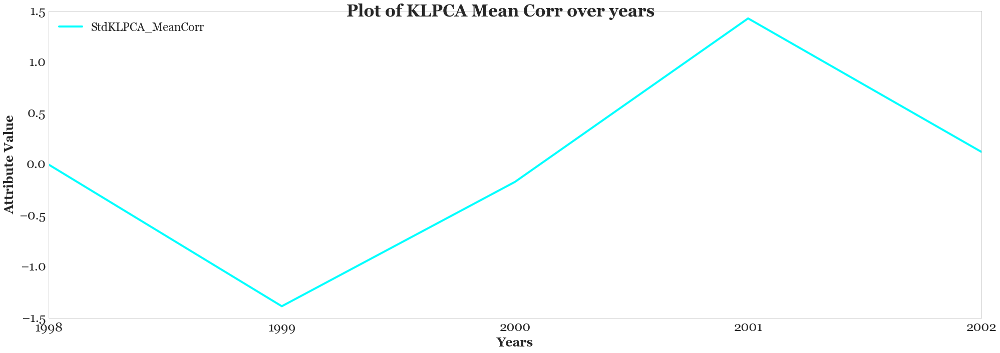

In [93]:
y_avgst_all.StdKLPCA_MeanCorr.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of KLPCA Mean Corr over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=2)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([-7., -6., -5., -4., -3., -2., -1.,  0.,  1.]),
 <a list of 9 Text yticklabel objects>)

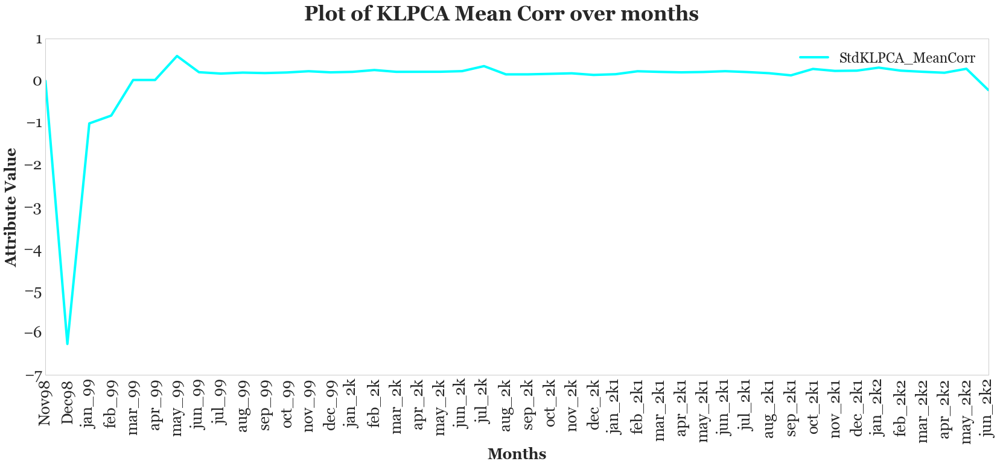

In [94]:
stat_all.StdKLPCA_MeanCorr.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of KLPCA Mean Corr over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=1)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

(array([  1.00000000e-03,   1.00000000e-02,   1.00000000e-01,
          1.00000000e+00,   1.00000000e+01]),
 <a list of 5 Text yticklabel objects>)

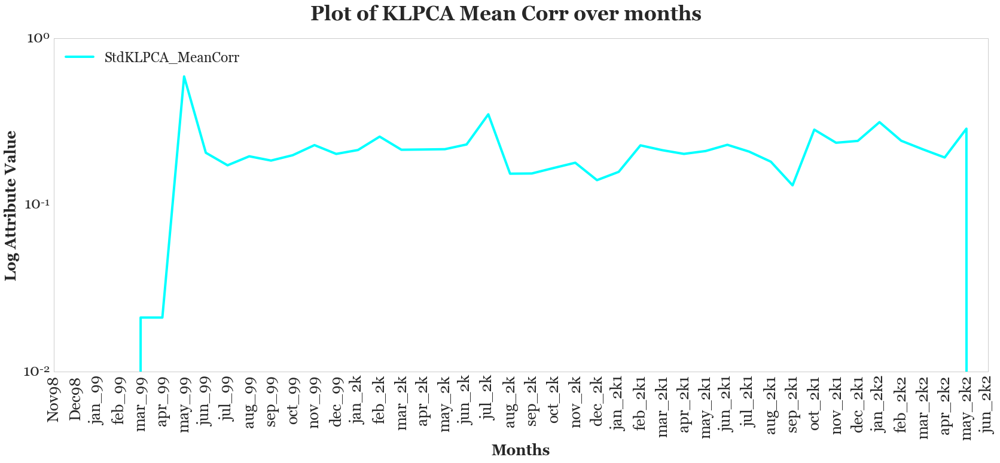

In [95]:
stat_all.StdKLPCA_MeanCorr.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10), logy=True)
plt.suptitle("Plot of KLPCA Mean Corr over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Log Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=2)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

# Resistance Distance

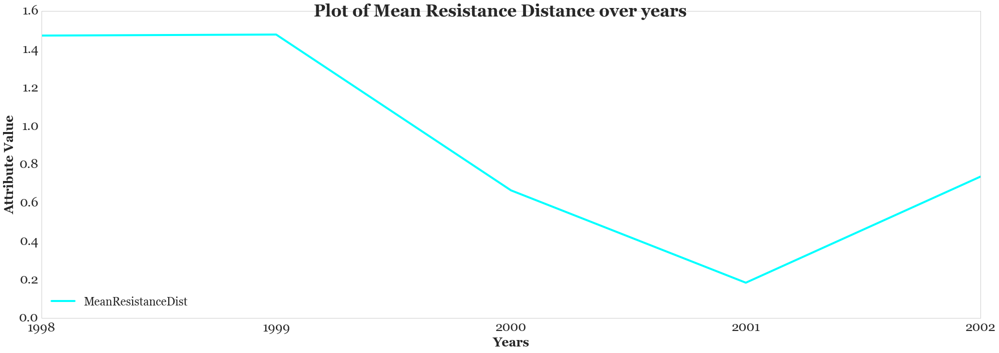

In [96]:
y_avgst_all.MeanResistanceDist.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Mean Resistance Distance over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([ 0.5,  1. ,  1.5,  2. ,  2.5,  3. ]),
 <a list of 6 Text yticklabel objects>)

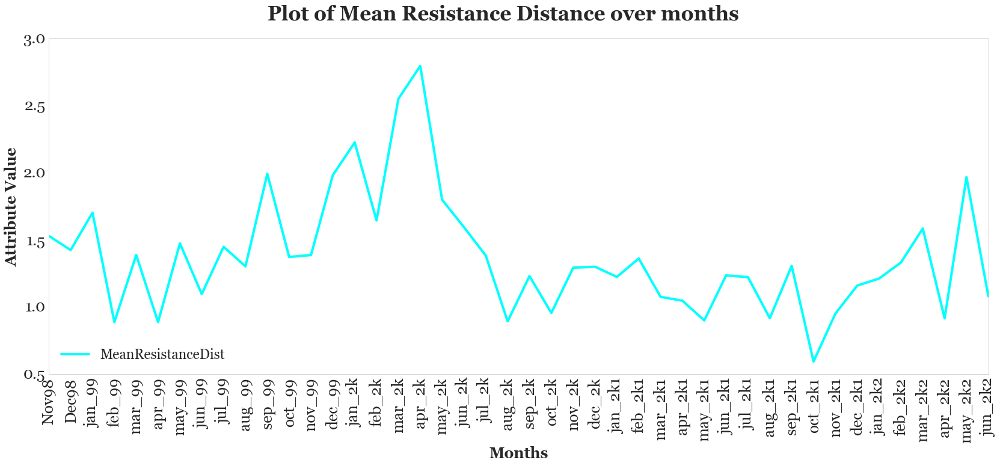

In [97]:
stat_all.MeanResistanceDist.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Mean Resistance Distance over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=3)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

# Stationarity Ratio

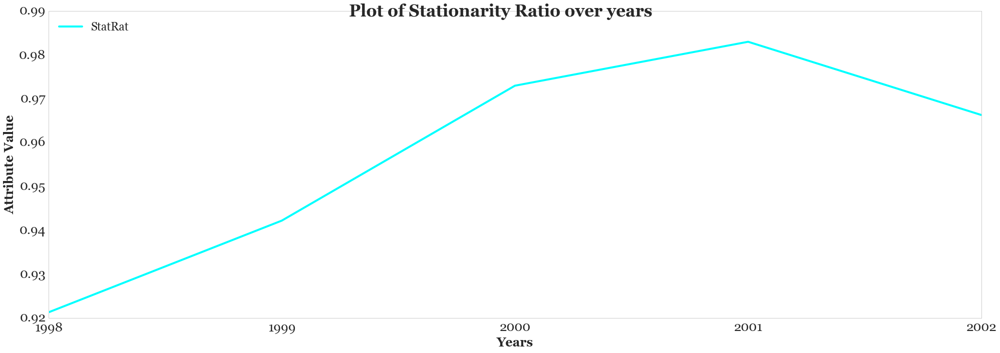

In [98]:
y_avgst_all.StatRat.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Stationarity Ratio over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=2)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)
plt.tight_layout()


(array([ 0.7 ,  0.75,  0.8 ,  0.85,  0.9 ,  0.95,  1.  ]),
 <a list of 7 Text yticklabel objects>)

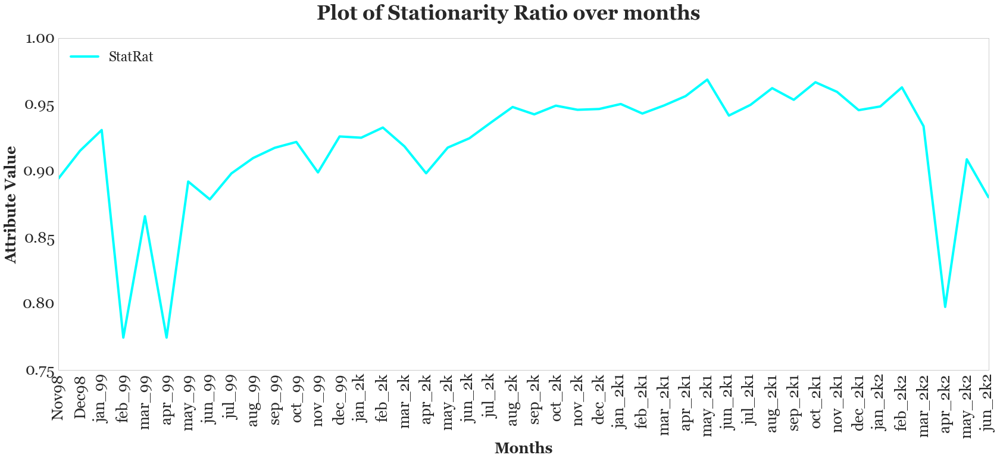

In [99]:
stat_all.StatRat.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Stationarity Ratio over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=23, loc=2)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

# Comparison of Attributes over time

(array([-8., -6., -4., -2.,  0.,  2.,  4.]),
 <a list of 7 Text yticklabel objects>)

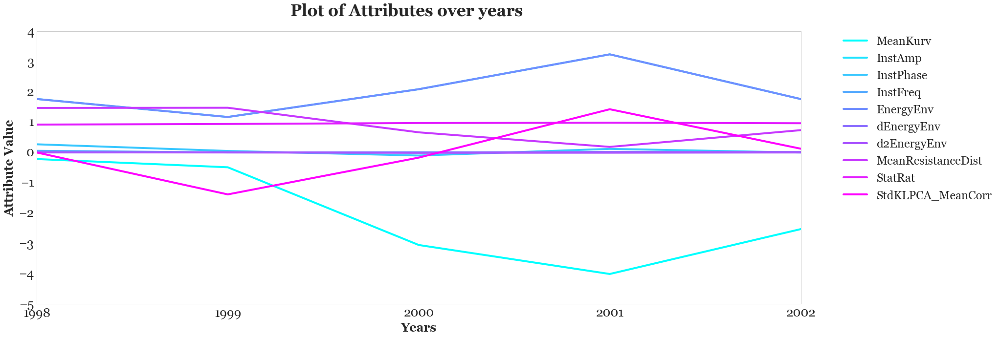

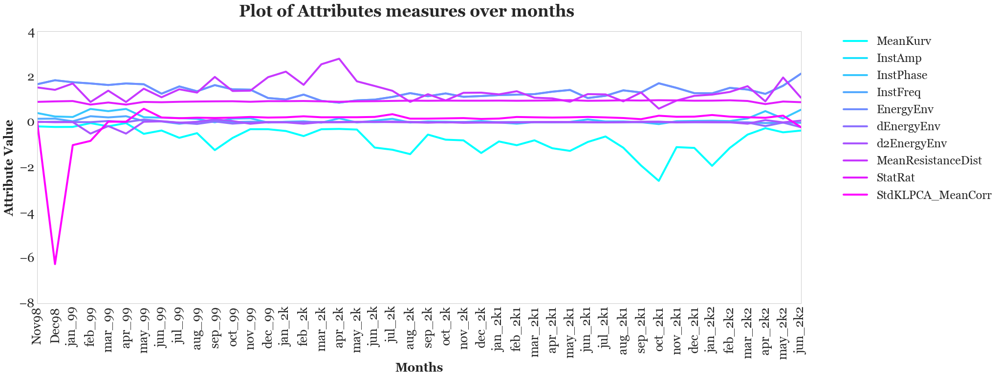

In [100]:
y_avgst_all.iloc[:,9:].plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Attributes over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)

stat_all.iloc[:,9:].plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Attributes measures over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

# Towards Global Measures

## Subgraph Stationarity

In [106]:
Ct_y = []
for i in range(0,len(all_year_G)-1):
    x = int(i)
    y = x +1
    Ct_y.append(subgraph_stat(all_year_G[x],all_year_G[y]))

In [107]:
Ct_m = []
for i in range(0,len(all_month_G)-1):
    x = int(i)
    y = x +1
    Ct_m.append(subgraph_stat(all_month_G[x],all_month_G[y]))

In [108]:
Ct_y

[0.30310524825452068,
 0.37838536898931635,
 0.55196098792073822,
 0.66442754991336916]

In [114]:
tmp3 = np.zeros(len(Ct_y)+1)
tmp3[1:]=Ct_y
tmp3

array([ 0.        ,  0.30310525,  0.37838537,  0.55196099,  0.66442755])

In [110]:
Ct_m[:5]

[0.56195148694901642,
 0.67700320038633011,
 0.3779644730092272,
 0.53452248382484879,
 0.53452248382484879]

In [119]:
tmp4 = np.zeros(len(Ct_m)+1)
tmp4[1:]=Ct_m
tmp4

array([ 0.        ,  0.56195149,  0.6770032 ,  0.37796447,  0.53452248,
        0.53452248,  0.30151134,  0.62418778,  0.56493268,  0.64655455,
        0.60572805,  0.66449864,  0.69156407,  0.48989795,  0.62609903,
        0.63748937,  0.66022529,  0.68268832,  0.61033232,  0.62400363,
        0.62754405,  0.61876404,  0.69455555,  0.66183399,  0.67545887,
        0.66466807,  0.6858916 ,  0.70393524,  0.67087945,  0.67054686,
        0.67039676,  0.70622784,  0.62254302,  0.59803739,  0.68533074,
        0.62489999,  0.7118685 ,  0.748884  ,  0.62864935,  0.67852807,
        0.40610041,  0.2763854 ,  0.37047929,  0.57259833])

In [139]:
np.cumsum(tmp3)/tmp3.shape[0]

array([ 0.        ,  0.06062105,  0.13629812,  0.24669032,  0.37957583])

In [142]:
zeta_y= pd.DataFrame(tmp3)
zeta_y = zeta_y.cumsum(axis=1)/(zeta_y.shape[0]-1)
zeta_y =  zeta_y.T
zeta_y.columns=years[1:]
zeta_y =  pd.DataFrame(zeta_y).T
zeta_y.columns=['ZetaYear']
zeta_y.head()

,ZetaYear
1998,0.000000
1999,0.075776
2000,0.094596
2001,0.137990
2002,0.166107


In [144]:
zeta_m = pd.DataFrame(tmp4)
zeta_m = zeta_m.cumsum(axis=1)/(zeta_m.shape[0]-1)
zeta_m =  zeta_m.T
zeta_m.columns=months
zeta_m =  pd.DataFrame(zeta_m).T
zeta_m.columns=['ZetaMonth']
zeta_m.head()

,ZetaMonth
Nov98,0.000000
Dec98,0.013069
jan_99,0.015744
feb_99,0.008790
mar_99,0.012431


(array([ 0.   ,  0.002,  0.004,  0.006,  0.008,  0.01 ,  0.012,  0.014,
         0.016,  0.018]), <a list of 10 Text yticklabel objects>)

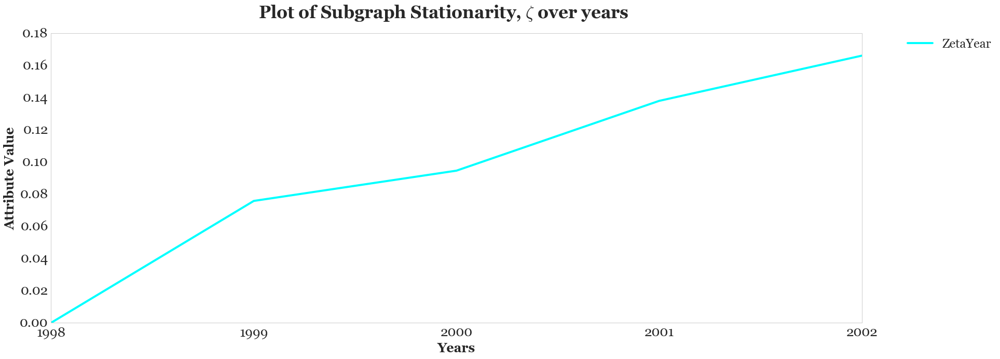

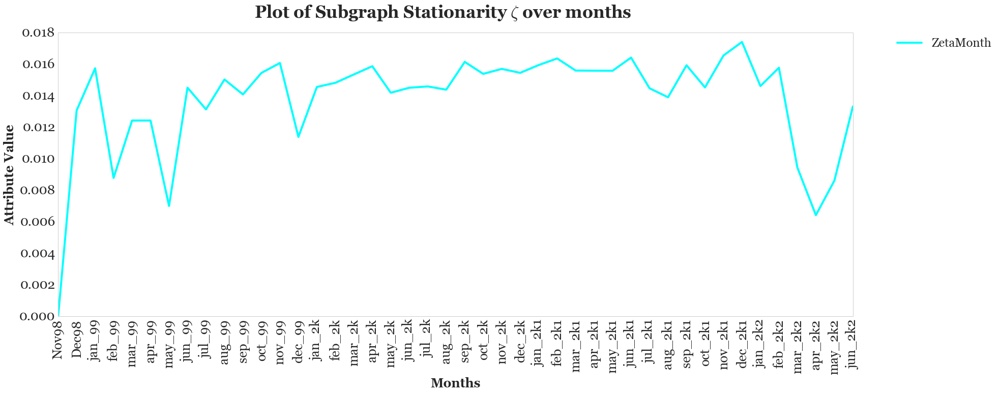

In [145]:
zeta_y.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Subgraph Stationarity, $\zeta$ over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)

zeta_m.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Subgraph Stationarity $\zeta$ over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

(array([ 0.98 ,  0.985,  0.99 ,  0.995,  1.   ,  1.005]),
 <a list of 6 Text yticklabel objects>)

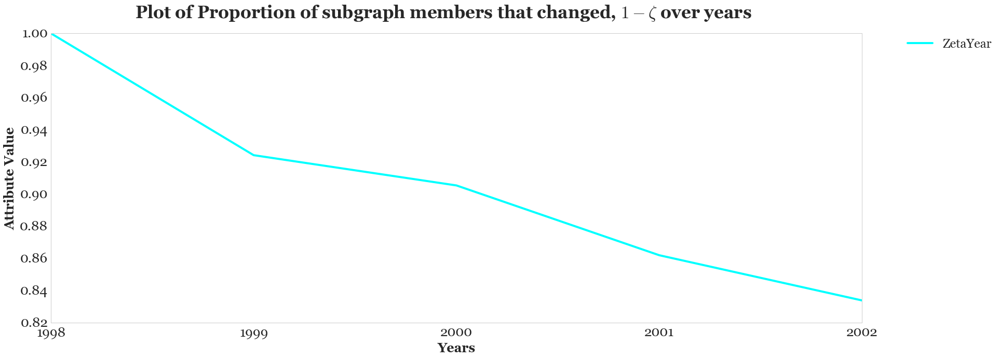

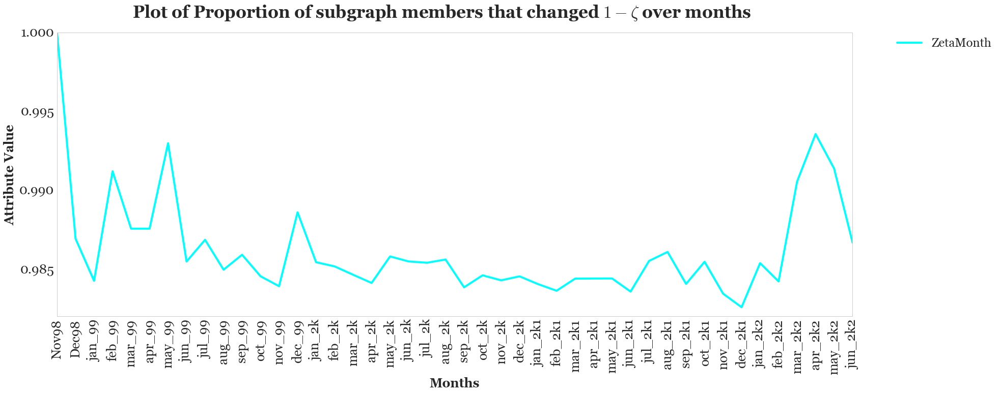

In [146]:
(1-zeta_y).plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Proportion of subgraph members that changed, $1-\zeta$ over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)

(1-zeta_m).plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Proportion of subgraph members that changed $1-\zeta$ over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

In [147]:
y_avgst_all['SubgraphStat']=zeta_y
stat_all['SubgraphStat']=zeta_m

In [153]:
persistence_y = y_avgst_all.mean(axis=1)/y_avgst_all.shape[0]
persistence_m = stat_all.mean(axis=1)/stat_all.shape[0]

(array([ 0.02,  0.03,  0.04,  0.05,  0.06,  0.07,  0.08,  0.09]),
 <a list of 8 Text yticklabel objects>)

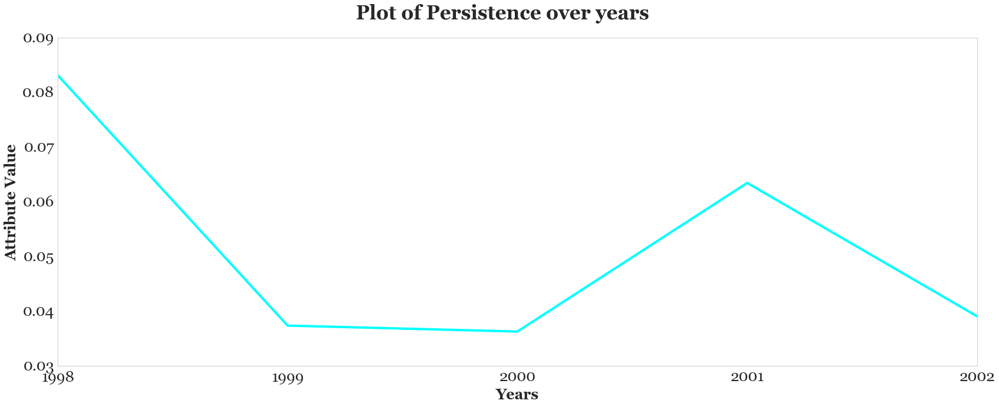

In [209]:
persistence_y.plot(fontsize=22, cmap='cool', figsize=(28,10))
plt.suptitle("Plot of Persistence over years", fontsize=33)
plt.xlabel("Years", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
#plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=26)
plt.yticks(fontsize=26)

(array([ 0.002,  0.004,  0.006,  0.008,  0.01 ,  0.012]),
 <a list of 6 Text yticklabel objects>)

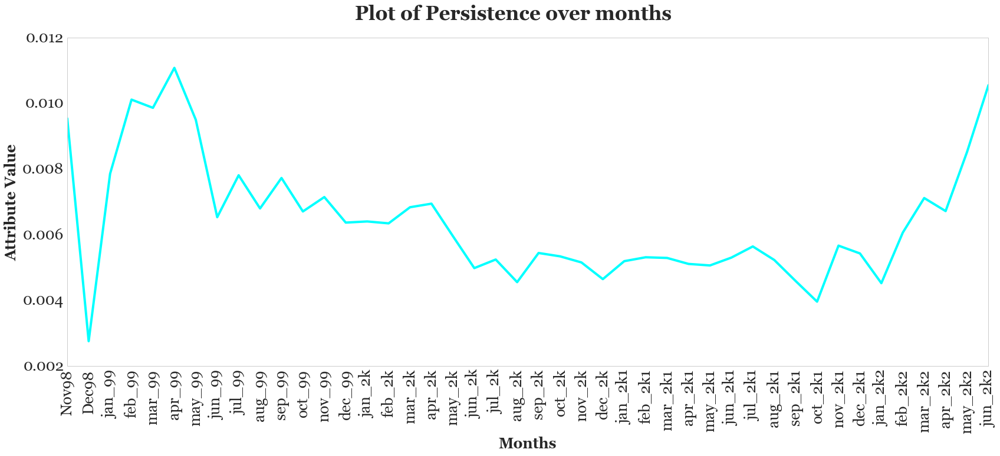

In [210]:
persistence_m.plot(fontsize=22, cmap='cool', rot=90, figsize=(28,10))
plt.suptitle("Plot of Persistence over months", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Attribute Value", fontsize=25)
#plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)

In [191]:
emerg_y= []
for i in range(len(persistence_y)-1):
    x = int(i)
    y = x +1
    emerg_y.append(emergence(persistence_y.values[y],persistence_y.values[x]))

In [192]:
emerg_y

[-0.37969038439694724,
 -0.014813452962272489,
 0.27240421370274737,
 -0.23767292526989964]

In [193]:
emerg_m= []
for i in range(0,persistence_m.shape[0]-1):
    x = int(i)
    y = x +1
    emerg_m.append(emergence(persistence_m.values[y],persistence_m.values[x]))

In [194]:
tmp5 = np.zeros(len(emerg_y)+1)
tmp5[1:]=emerg_y
tmp5

array([ 0.        , -0.37969038, -0.01481345,  0.27240421, -0.23767293])

In [195]:
tmp6 = np.zeros(len(emerg_m)+1)
tmp6[1:]=emerg_m
tmp6

array([ 0.        , -0.55109434,  0.4798733 ,  0.12553807, -0.01249267,
        0.05804516, -0.07670843, -0.18492781,  0.08891891, -0.0690909 ,
        0.06382665, -0.07057903,  0.03160969, -0.05747759,  0.00272524,
       -0.00456203,  0.0372152 ,  0.00788364, -0.07646148, -0.08903507,
        0.02554792, -0.07021498,  0.08867486, -0.00941761, -0.01768235,
       -0.05182133,  0.05552839,  0.01130044, -0.00195038, -0.01747139,
       -0.00455507,  0.02302972,  0.03096771, -0.03779569, -0.06525762,
       -0.07338022,  0.17698451, -0.02135674, -0.0908677 ,  0.14520373,
        0.07984494, -0.02867875,  0.11809058,  0.10657907])

In [200]:
emerg_y_df = pd.DataFrame(emerg_y).T
emerg_y_df.columns=years[2:]
emerg_y_df = emerg_y_df.T
emerg_y_df.columns = ['EmergenceYear']
emerg_y_df.head()

,EmergenceYear
1999,-0.379690
2000,-0.014813
2001,0.272404
2002,-0.237673


In [204]:
emerg_m_df = pd.DataFrame(emerg_m).T
emerg_m_df.columns=months[1:]
emerg_m_df = emerg_m_df.T
emerg_m_df.columns = ['EmergenceMonth']
emerg_m_df.head()

,EmergenceMonth
Dec98,-0.551094
jan_99,0.479873
feb_99,0.125538
mar_99,-0.012493
apr_99,0.058045


(array([-0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4]),
 <a list of 9 Text yticklabel objects>)

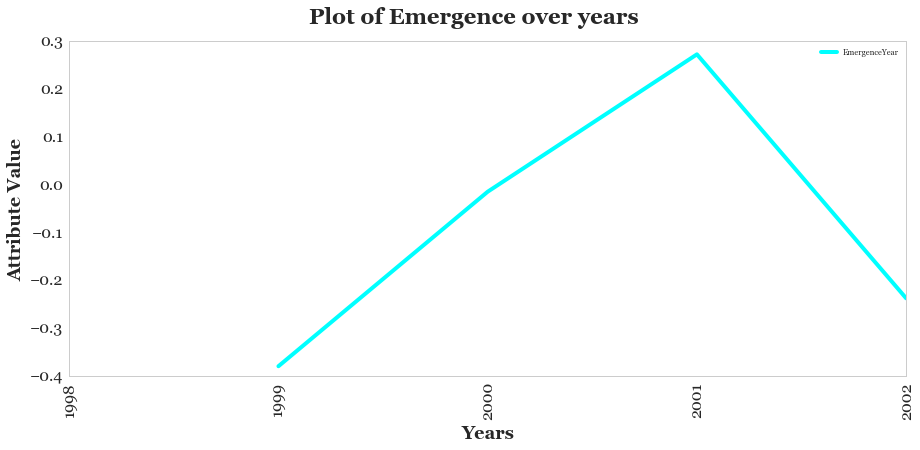

In [214]:
emerg_y_df.plot(fontsize=22, cmap='cool', rot=90)
plt.suptitle("Plot of Emergence over years", fontsize=22)
plt.xlabel("Years", fontsize=18)
plt.ylabel("Attribute Value", fontsize=18)
#plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(years[1:],[i for i in years[1:]],fontsize=16)
plt.yticks(fontsize=16)

(array([-0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8]),
 <a list of 9 Text yticklabel objects>)

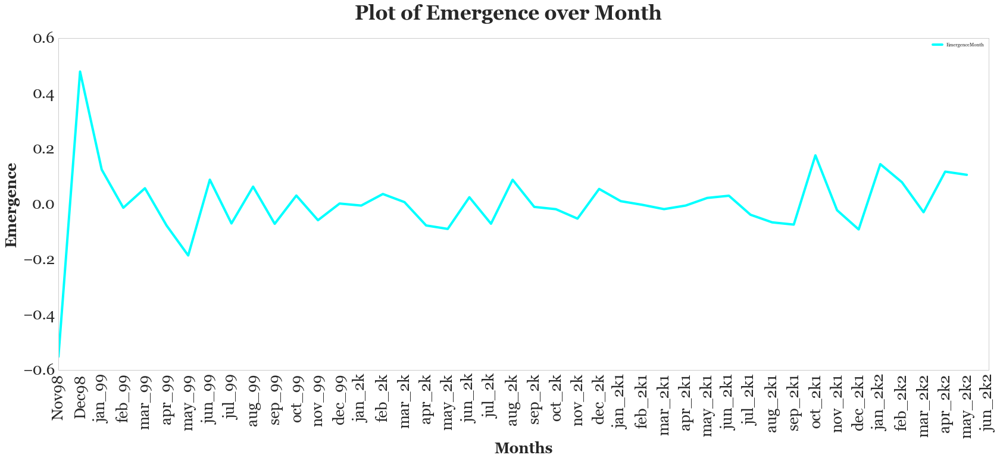

In [215]:
emerg_m_df.plot(fontsize=22, cmap='cool', figsize=(28,10), rot=90)
plt.suptitle("Plot of Emergence over Month", fontsize=33)
plt.xlabel("Months", fontsize=25)
plt.ylabel("Emergence", fontsize=25)
#plt.legend(fontsize=24, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(np.arange(len(months)), months,fontsize=26)
plt.yticks(fontsize=26)